Connected to .venv (Python 3.11.9)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

2026-01-17 17:45:08,290 - qm - INFO     - Starting session: 2c720789-3fef-4f0e-9c01-8ffd01b05596


c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\qm\results\__init__.py:15: DeprecationWarning: qm.results is deprecated since "1.2.3" and will be removed in "1.3.0". If you need anything from this module, import it directly from `qm` or from `qm.simulate` for simulator-related functionality.
  warnings.warn(


In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]#,"qB5"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 17:45:14,757 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 17:45:18,473 - qm - INFO     - Opening QM
2026-01-17 17:45:18,489 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[17:45:21] QUA program submitted to arbel (id = 22999d98-a1eb-4b6f-a51d-f09fa0124b43)              ]8;id=89409;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=861853;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[17:45:22] Execution started                                                                       ]8;id=207763;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=587662;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[17:45:36] Execution finished                                                    

2026-01-17 17:45:36,559 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 17:45:36,559 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 17:45:36,714 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 198.0 deg | ge_threshold: 1.3 mV | rus_threshold: 0.7 mV | readout fidelity: 86.2 % 
 
2026-01-17 17:45:36,723 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 354.8 deg | ge_threshold: 1.9 mV | rus_threshold: 1.2 mV | readout fidelity: 90.9 % 
 
2026-01-17 17:45:36,724 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 358.5 deg | ge_threshold: 2.0 mV | rus_threshold: 1.4 mV | readout fidelity: 92.0 % 
 
2026-01-17 17:45:36,725 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 357.1 deg | ge_threshold: 1.3 mV | rus_threshold: 0.9 mV | readout fidelity: 95.9 % 
 
2026-01-17 17:45:36,726 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 306.1 deg | ge_threshold: 1.2 mV | rus_threshold: 0.9 mV | readout fidelity: 87.1 % 
 


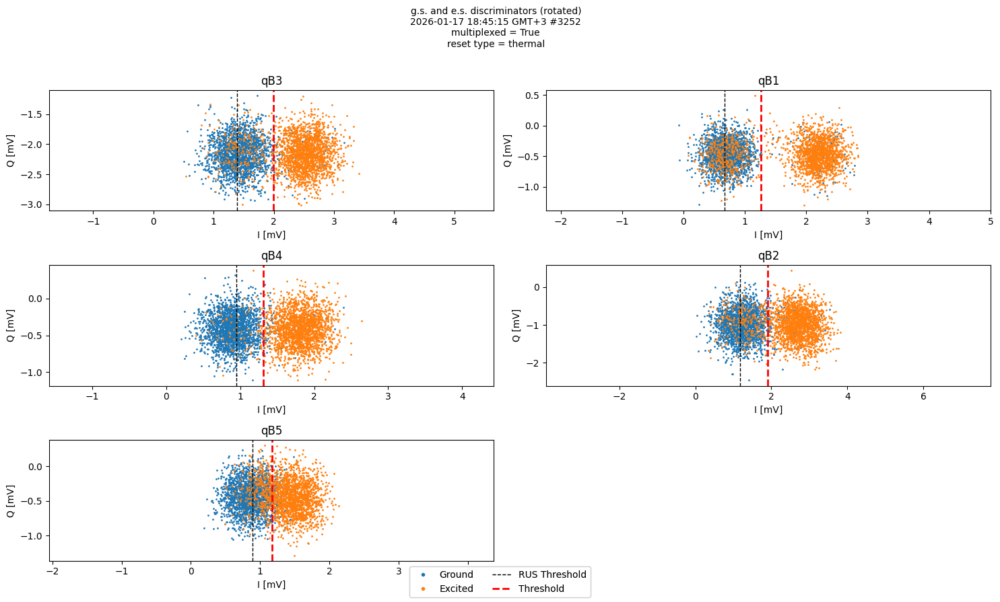

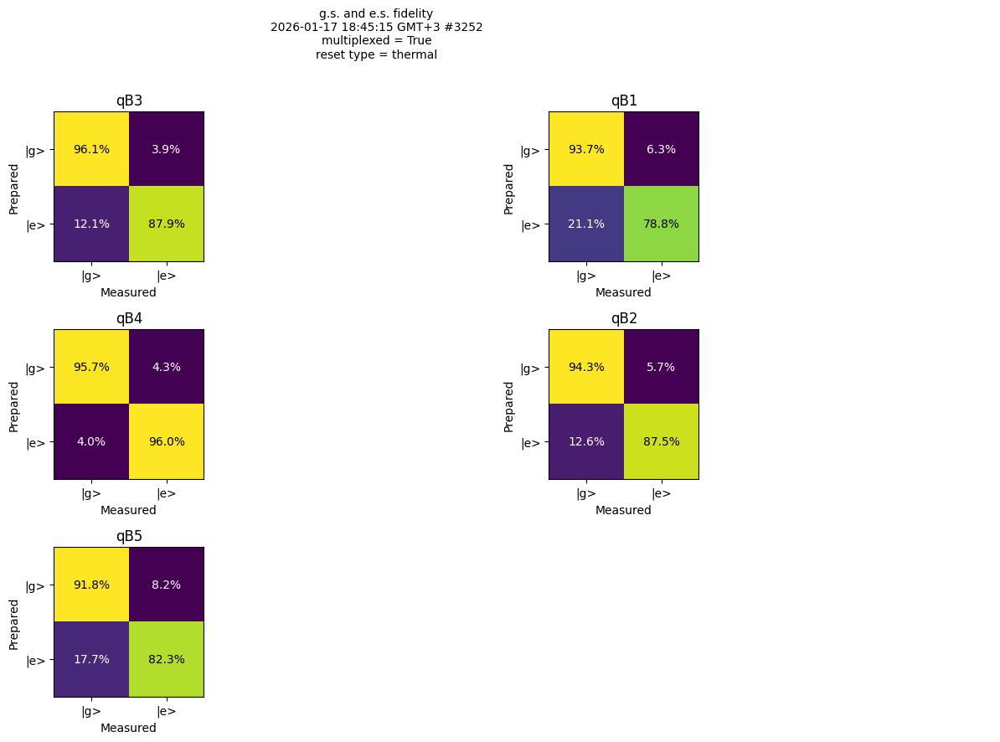

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

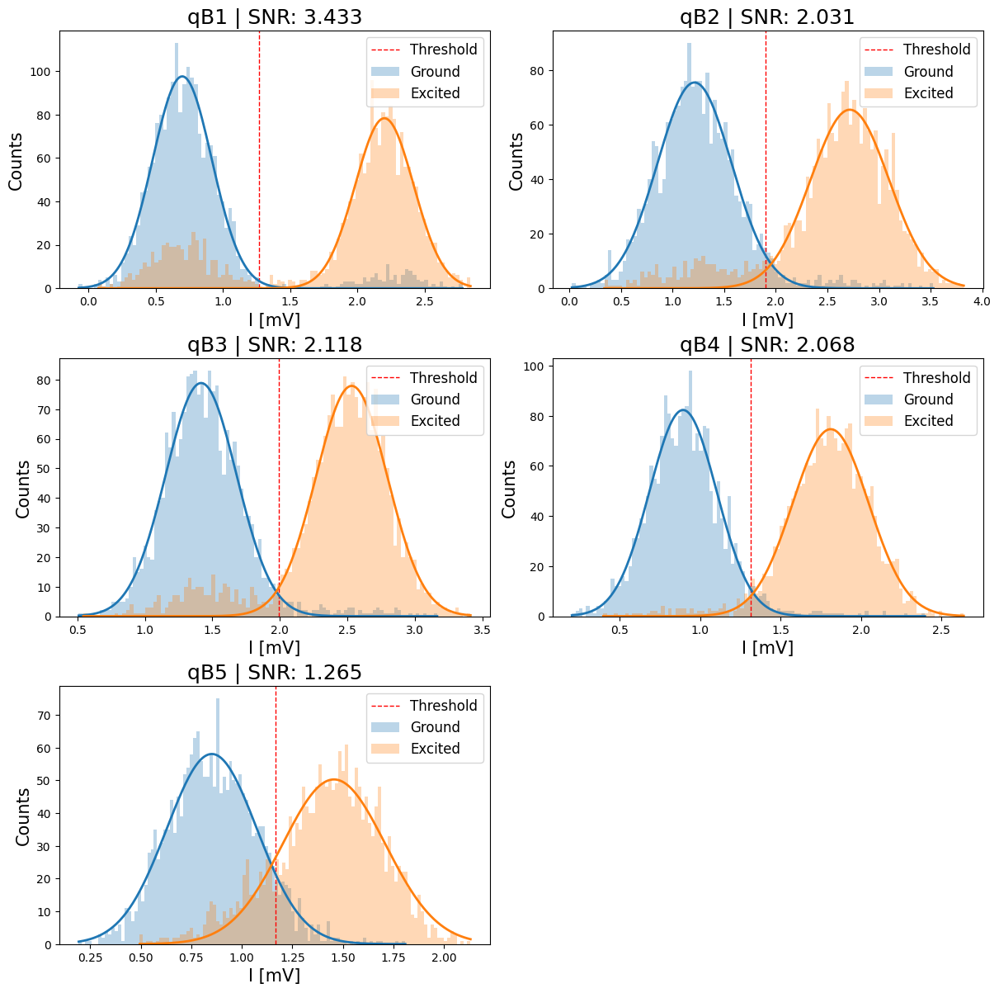

In [ ]:
from scipy.optimize import curve_fit
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("", fontsize=16)
plt.show()

In [ ]:
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-66,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.9 dBm, Tro=1500, Aro=0.009, F=86.25%, SNR=3.43 F_est=97.75%
qB2: Ps=-114.16 dBm, Tro=760, Aro=0.011, F=90.90%, SNR=2.03 F_est=94.80%
qB3: Ps=-109.88 dBm, Tro=1100, Aro=0.018, F=92.00%, SNR=2.12 F_est=94.99%
qB4: Ps=-105.16 dBm, Tro=1200, Aro=0.031, F=95.85%, SNR=2.07 F_est=94.36%
qB5: Ps=-112.71 dBm, Tro=1500, Aro=0.013, F=87.05%, SNR=1.27 F_est=75.28%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]#,"qB5"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 17:46:46,790 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 17:46:49,607 - qm - INFO     - Opening QM
2026-01-17 17:46:49,607 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[17:46:52] QUA program submitted to arbel (id = a250085e-999f-45e0-8a18-8ab4339d9b27)              ]8;id=694096;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=296835;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[17:46:53] Execution started                                                                       ]8;id=538153;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=749262;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[17:46:58] Execution finished                                                   

2026-01-17 17:46:58,954 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 17:46:58,955 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 17:46:59,152 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 169.9 deg | ge_threshold: -2.3 mV | rus_threshold: -2.1 mV | readout fidelity: 51.8 % 
 
2026-01-17 17:46:59,168 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 184.3 deg | ge_threshold: -1.9 mV | rus_threshold: -2.1 mV | readout fidelity: 51.3 % 
 
2026-01-17 17:46:59,169 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 5.7 deg | ge_threshold: 4.4 mV | rus_threshold: 3.5 mV | readout fidelity: 95.2 % 
 
2026-01-17 17:46:59,169 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 39.5 deg | ge_threshold: 3.3 mV | rus_threshold: 3.6 mV | readout fidelity: 51.7 % 
 
2026-01-17 17:46:59,170 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 261.2 deg | ge_threshold: -2.1 mV | rus_threshold: -1.9 mV | readout fidelity: 50.5 % 
 


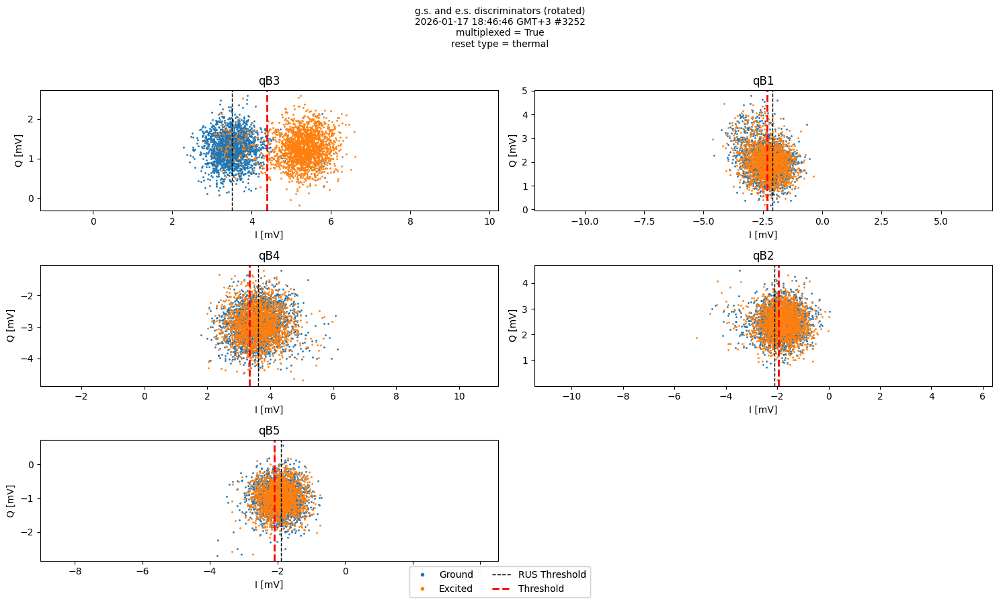

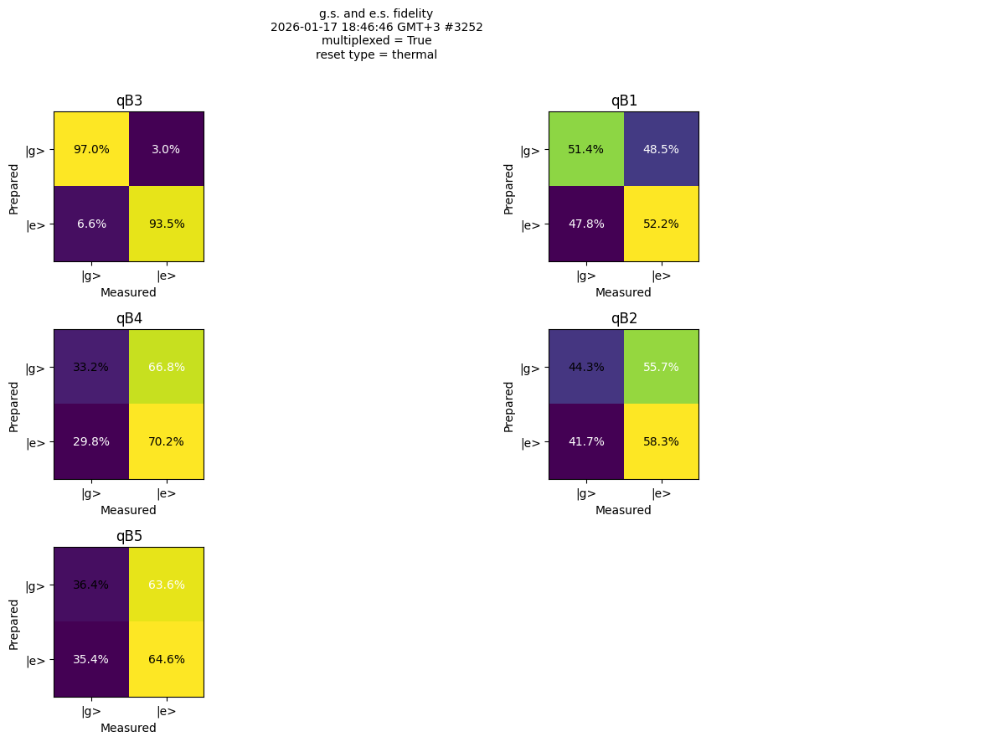

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

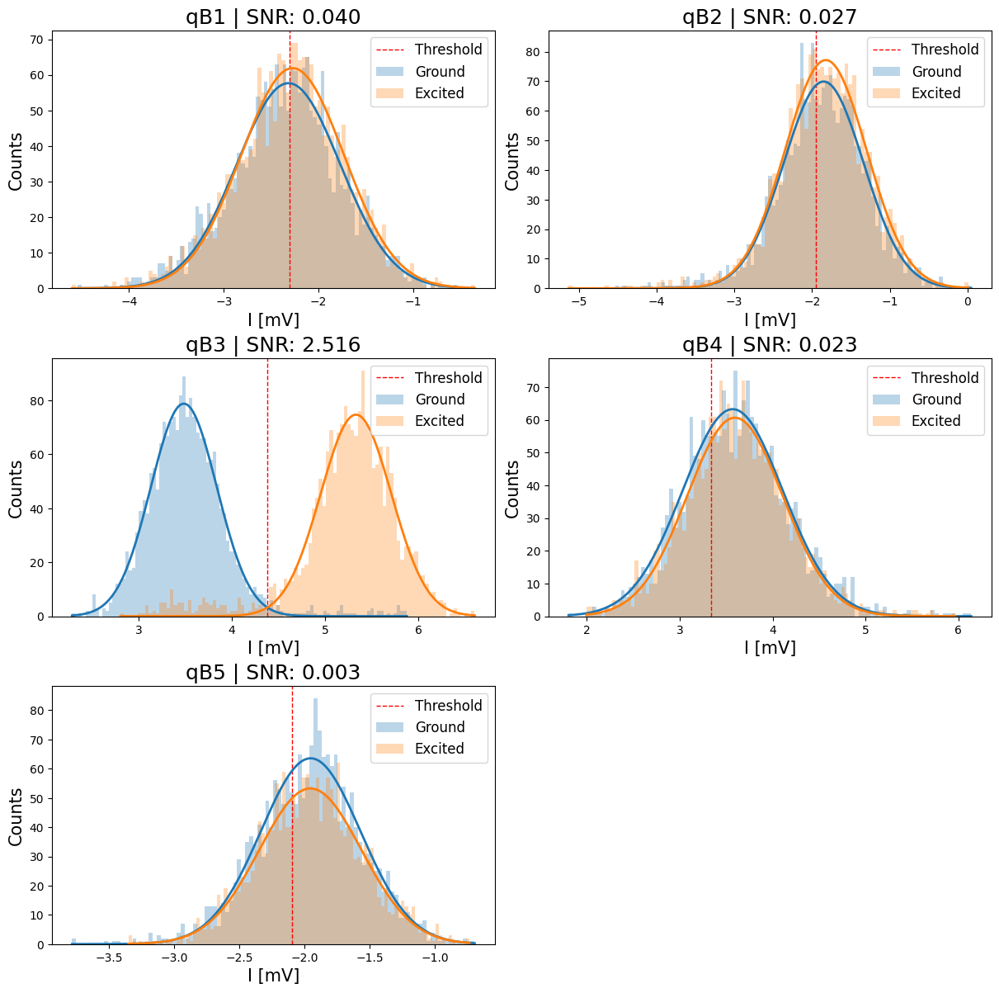

In [ ]:
from scipy.optimize import curve_fit
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("", fontsize=16)
plt.show()

In [ ]:
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-66,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-110.91 dBm, Tro=700, Aro=0.016, F=51.82%, SNR=0.04 F_est=3.15%
qB2: Ps=-108.97 dBm, Tro=700, Aro=0.02, F=51.30%, SNR=0.03 F_est=2.12%
qB3: Ps=-111.47 dBm, Tro=2000, Aro=0.015, F=95.23%, SNR=2.52 F_est=96.03%
qB4: Ps=-101.01 dBm, Tro=700, Aro=0.05, F=51.73%, SNR=0.02 F_est=1.79%
qB5: Ps=-111.47 dBm, Tro=1500, Aro=0.015, F=50.52%, SNR=0.00 F_est=0.20%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]#,"qB5"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 17:48:50,754 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 17:48:53,372 - qm - INFO     - Opening QM
2026-01-17 17:48:53,373 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[17:48:56] QUA program submitted to arbel (id = 5de37f6e-c2b6-4672-b683-2fcb43ba4a5b)              ]8;id=877520;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=854399;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
           Execution started                                                                       ]8;id=886877;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=960263;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[17:49:02] Execution finished                                                   

2026-01-17 17:49:02,482 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 17:49:02,484 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 17:49:02,627 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 201.1 deg | ge_threshold: 1.3 mV | rus_threshold: 0.8 mV | readout fidelity: 85.3 % 
 
2026-01-17 17:49:02,636 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 359.4 deg | ge_threshold: 2.0 mV | rus_threshold: 1.2 mV | readout fidelity: 92.6 % 
 
2026-01-17 17:49:02,636 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 359.9 deg | ge_threshold: 2.4 mV | rus_threshold: 1.8 mV | readout fidelity: 93.4 % 
 
2026-01-17 17:49:02,636 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 355.7 deg | ge_threshold: 1.3 mV | rus_threshold: 0.9 mV | readout fidelity: 96.8 % 
 
2026-01-17 17:49:02,640 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 307.8 deg | ge_threshold: 1.2 mV | rus_threshold: 0.8 mV | readout fidelity: 88.3 % 
 


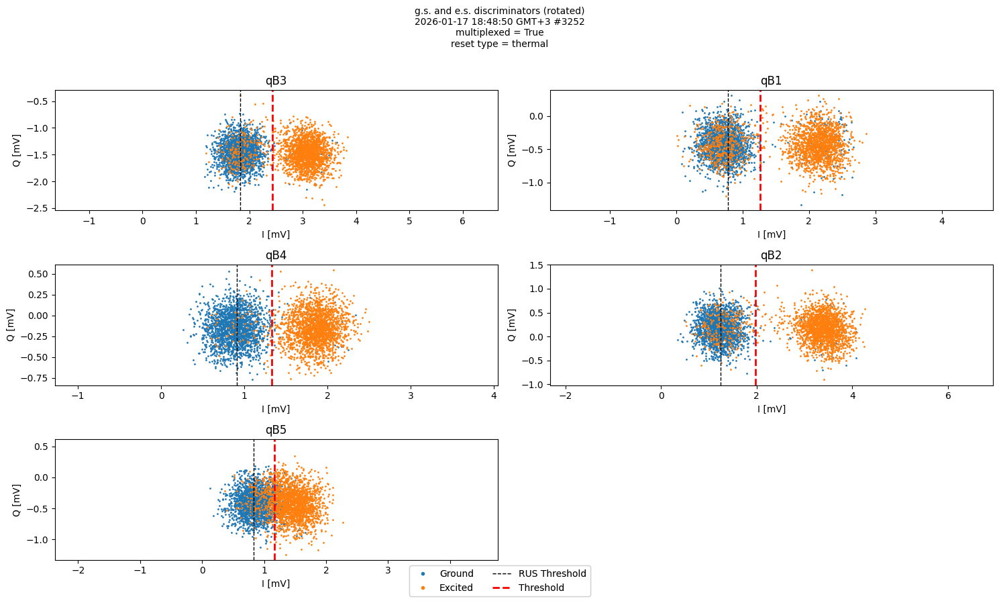

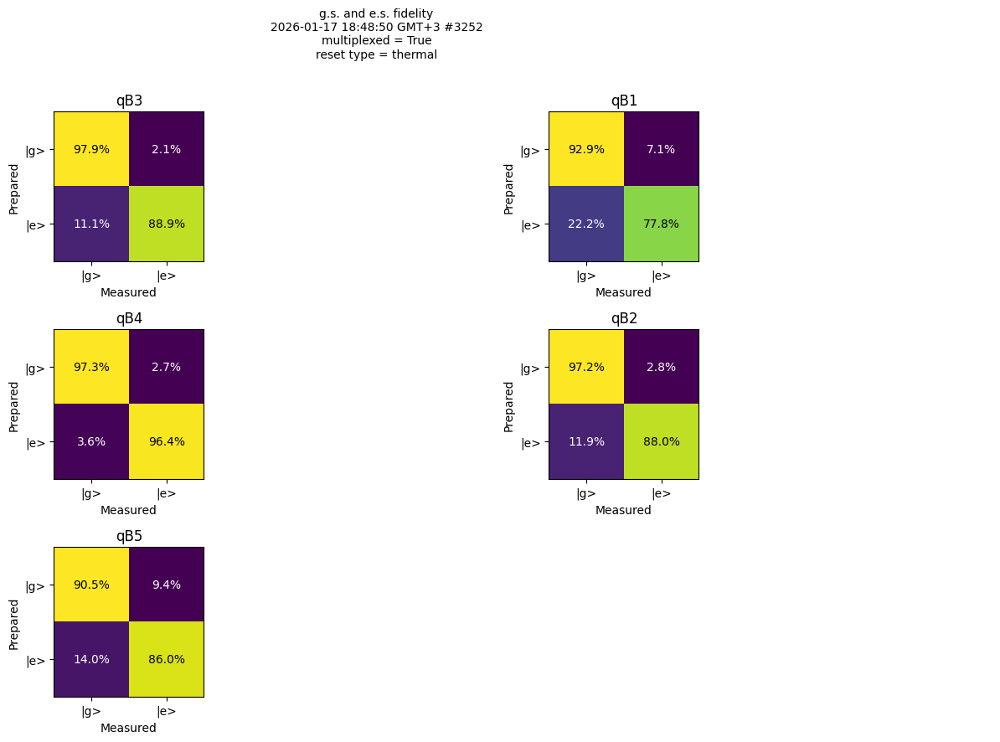

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

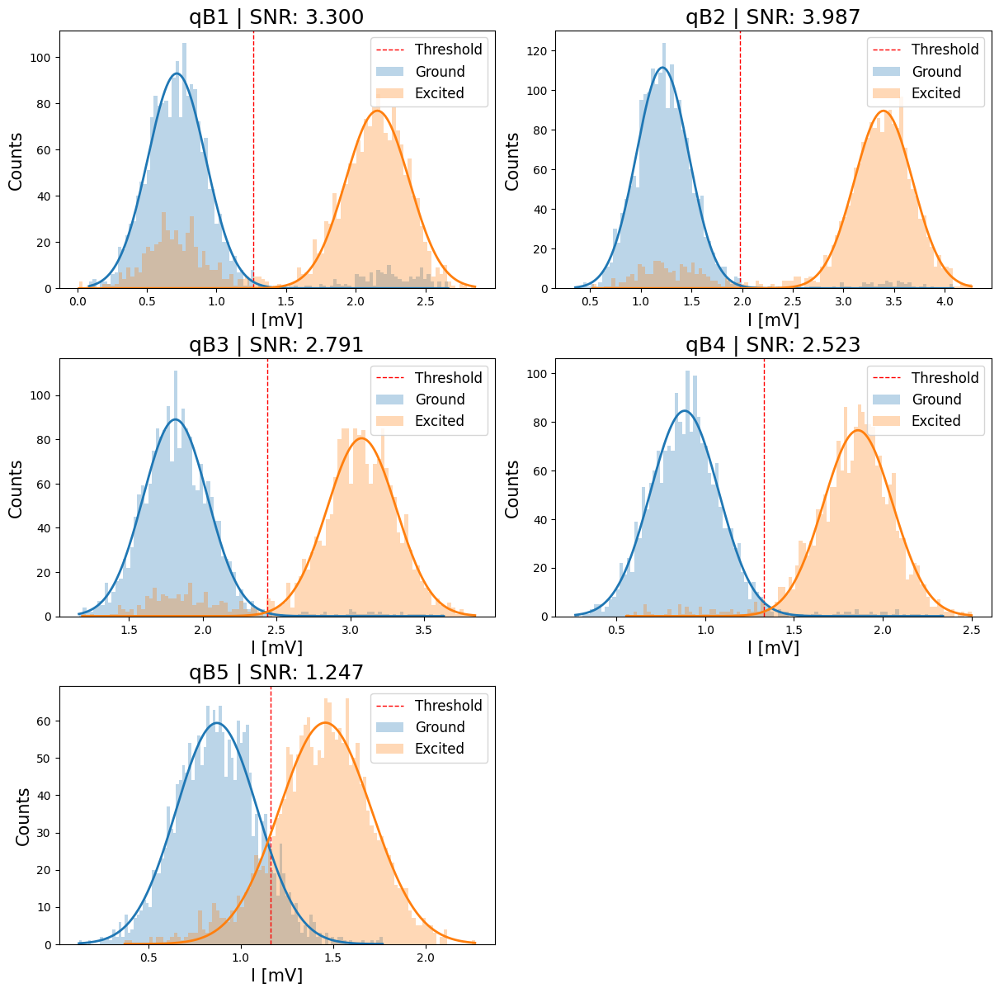

In [ ]:
from scipy.optimize import curve_fit
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("", fontsize=16)
plt.show()

In [ ]:
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-66,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.9 dBm, Tro=1500, Aro=0.009, F=85.33%, SNR=3.30 F_est=97.72%
qB2: Ps=-113.41 dBm, Tro=1500, Aro=0.012, F=92.62%, SNR=3.99 F_est=97.99%
qB3: Ps=-109.88 dBm, Tro=1500, Aro=0.018, F=93.40%, SNR=2.79 F_est=97.24%
qB4: Ps=-105.16 dBm, Tro=1500, Aro=0.031, F=96.85%, SNR=2.52 F_est=96.57%
qB5: Ps=-112.71 dBm, Tro=1500, Aro=0.013, F=88.27%, SNR=1.25 F_est=74.64%


In [ ]:
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=86.78%, SNR=3.60 F_est=97.78%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=92.83%, SNR=3.89 F_est=97.98%
qB3: Ps=-109.93 dBm, Tro=1500, Aro=0.045, F=94.50%, SNR=3.01 F_est=97.50%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.67%, SNR=2.80 F_est=97.22%
qB5: Ps=-112.11 dBm, Tro=1500, Aro=0.035, F=83.65%, SNR=0.99 F_est=64.03%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:25:05,933 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:25:08,864 - qm - INFO     - Opening QM
2026-01-17 20:25:08,866 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:25:11] QUA program submitted to arbel (id = 2aaeacd9-4f47-42c0-864a-4bf8543849e3)              ]8;id=395179;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=519600;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:27:50] Execution started                                                                       ]8;id=696553;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=696944;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:27:56] Execution finished                                                   

2026-01-17 20:27:56,464 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:27:56,465 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:27:56,639 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 357.6 deg | ge_threshold: 2.5 mV | rus_threshold: 1.0 mV | readout fidelity: 92.9 % 
 
2026-01-17 20:27:56,641 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 2.3 deg | ge_threshold: 4.0 mV | rus_threshold: 2.3 mV | readout fidelity: 96.0 % 
 
2026-01-17 20:27:56,641 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 324.7 deg | ge_threshold: 7.2 mV | rus_threshold: 5.4 mV | readout fidelity: 94.8 % 
 
2026-01-17 20:27:56,644 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 295.1 deg | ge_threshold: 2.1 mV | rus_threshold: 0.5 mV | readout fidelity: 97.4 % 
 
2026-01-17 20:27:56,645 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 115.4 deg | ge_threshold: 2.5 mV | rus_threshold: 2.2 mV | readout fidelity: 85.7 % 
 


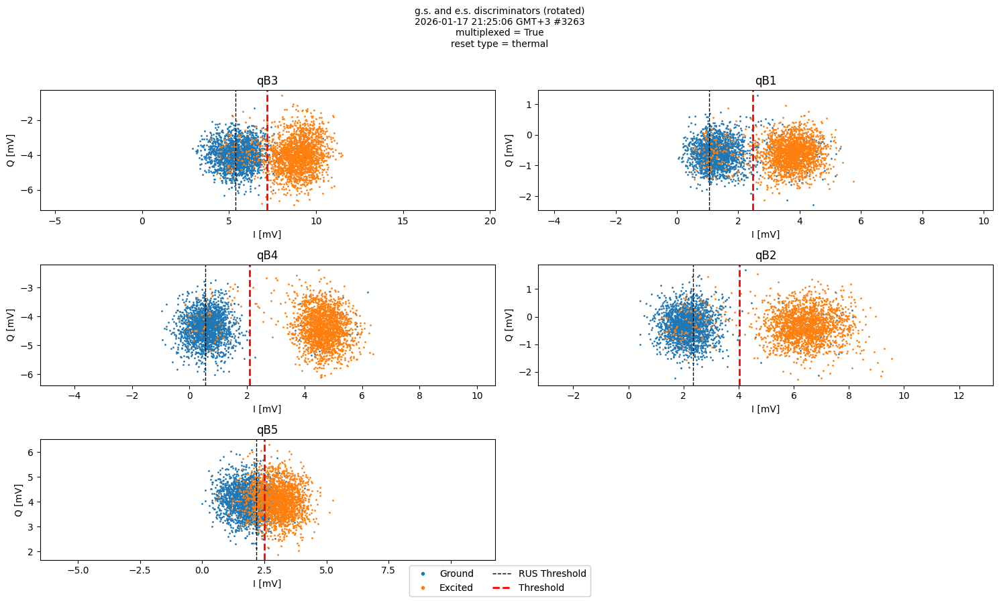

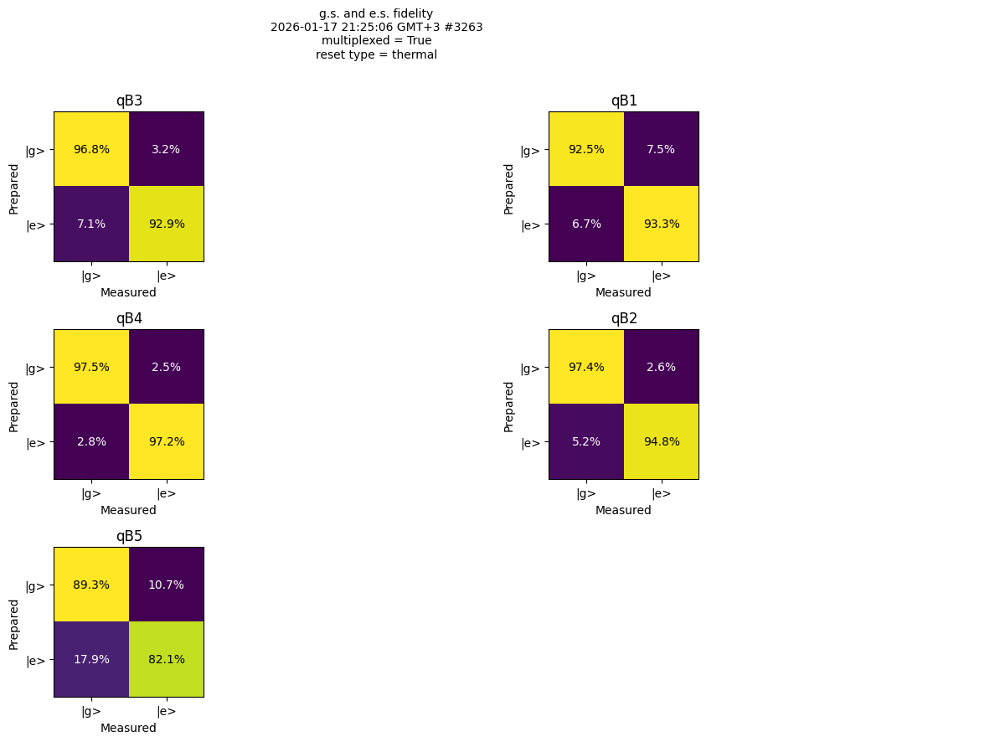

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


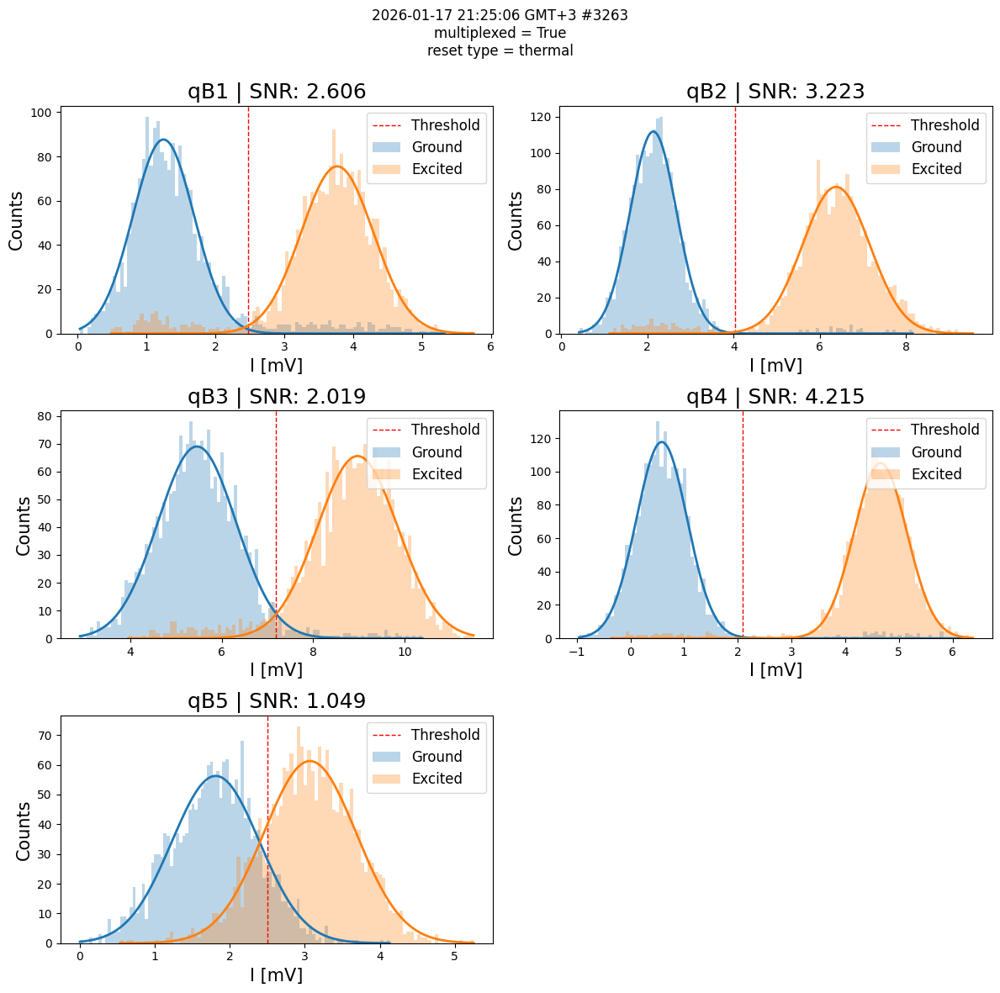

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=92.88%, SNR=2.61 F_est=95.27%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=96.05%, SNR=3.22 F_est=97.56%
qB3: Ps=-109.93 dBm, Tro=1500, Aro=0.045, F=94.85%, SNR=2.02 F_est=93.09%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.38%, SNR=4.21 F_est=97.66%
qB5: Ps=-112.11 dBm, Tro=1500, Aro=0.035, F=85.72%, SNR=1.05 F_est=67.40%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:30:47,859 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:30:50,437 - qm - INFO     - Opening QM
2026-01-17 20:30:50,439 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:30:53] QUA program submitted to arbel (id = 42456b8e-63de-46d3-a6b9-e4c17550c272)              ]8;id=129130;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=526276;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
           Execution started                                                                       ]8;id=144138;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=579544;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:31:00] Execution finished                                                   

2026-01-17 20:31:00,278 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:31:00,280 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:31:00,417 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 358.2 deg | ge_threshold: 2.4 mV | rus_threshold: 1.3 mV | readout fidelity: 92.8 % 
 
2026-01-17 20:31:00,418 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 3.4 deg | ge_threshold: 4.1 mV | rus_threshold: 2.2 mV | readout fidelity: 95.8 % 
 
2026-01-17 20:31:00,419 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 331.2 deg | ge_threshold: 8.5 mV | rus_threshold: 6.6 mV | readout fidelity: 94.9 % 
 
2026-01-17 20:31:00,421 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 295.6 deg | ge_threshold: 2.1 mV | rus_threshold: 0.7 mV | readout fidelity: 98.0 % 
 
2026-01-17 20:31:00,422 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 117.4 deg | ge_threshold: 2.4 mV | rus_threshold: 1.8 mV | readout fidelity: 84.6 % 
 


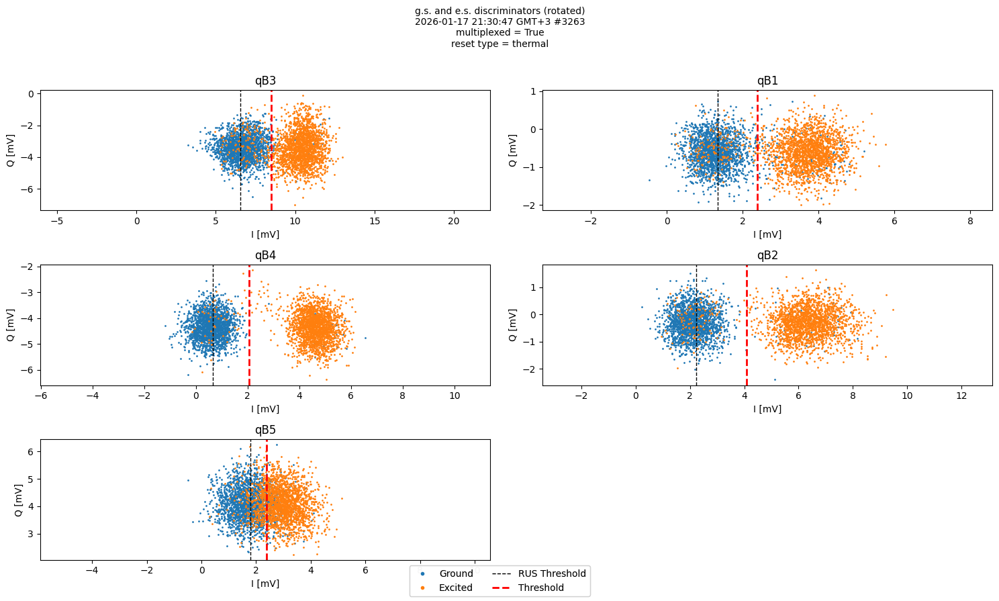

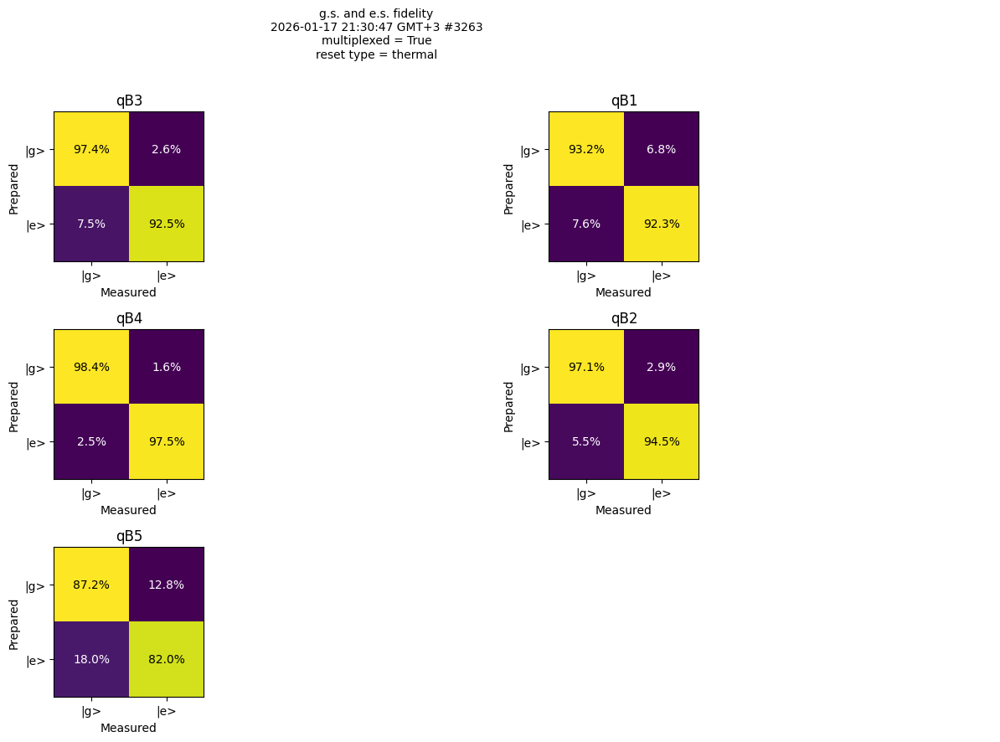

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


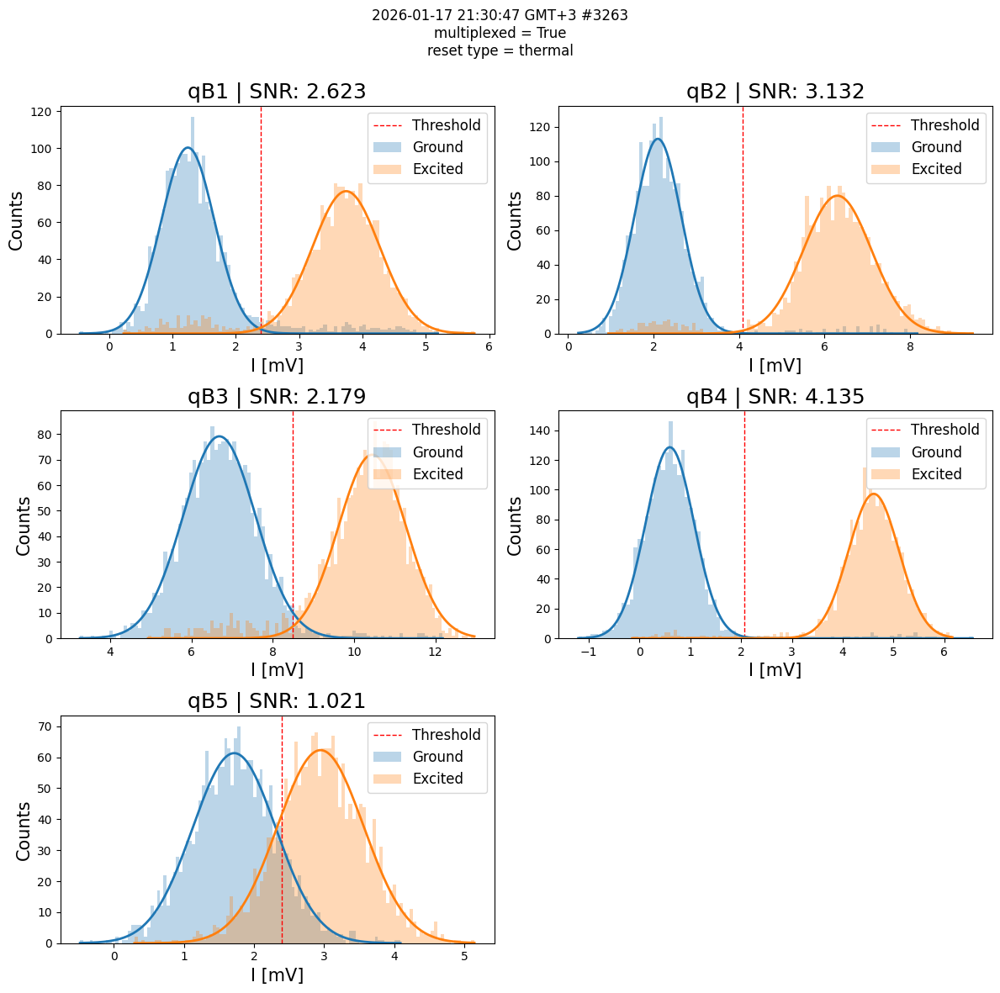

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=92.80%, SNR=2.62 F_est=95.31%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=95.83%, SNR=3.13 F_est=97.52%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=94.92%, SNR=2.18 F_est=94.47%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.95%, SNR=4.14 F_est=97.66%
qB5: Ps=-112.11 dBm, Tro=1500, Aro=0.035, F=84.58%, SNR=1.02 F_est=66.18%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:31:21,235 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:31:23,908 - qm - INFO     - Opening QM
2026-01-17 20:31:23,909 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:31:27] QUA program submitted to arbel (id = f8f261db-cd31-4994-af0c-b98e16512ae4)              ]8;id=173369;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=443964;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:31:28] Execution started                                                                       ]8;id=526312;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=724364;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:31:35] Execution finished                                                   

2026-01-17 20:31:35,273 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:31:35,275 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:31:35,410 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 358.7 deg | ge_threshold: 2.6 mV | rus_threshold: 1.0 mV | readout fidelity: 92.4 % 
 
2026-01-17 20:31:35,412 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 4.3 deg | ge_threshold: 3.8 mV | rus_threshold: 2.2 mV | readout fidelity: 96.0 % 
 
2026-01-17 20:31:35,413 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 338.6 deg | ge_threshold: 11.6 mV | rus_threshold: 9.7 mV | readout fidelity: 91.4 % 
 
2026-01-17 20:31:35,414 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 295.8 deg | ge_threshold: 2.6 mV | rus_threshold: 0.7 mV | readout fidelity: 97.4 % 
 
2026-01-17 20:31:35,416 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 117.4 deg | ge_threshold: 2.4 mV | rus_threshold: 2.0 mV | readout fidelity: 83.0 % 
 


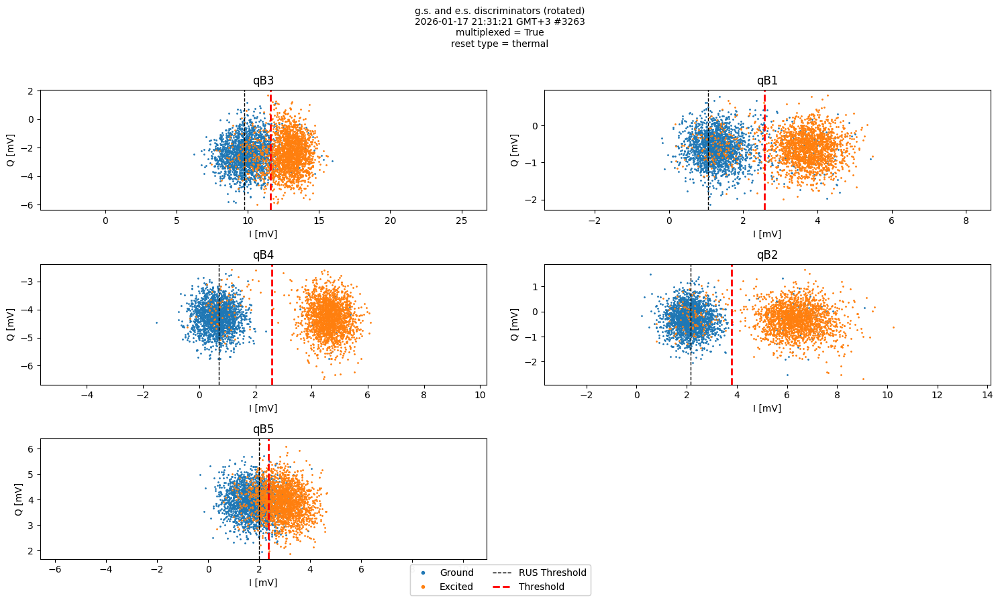

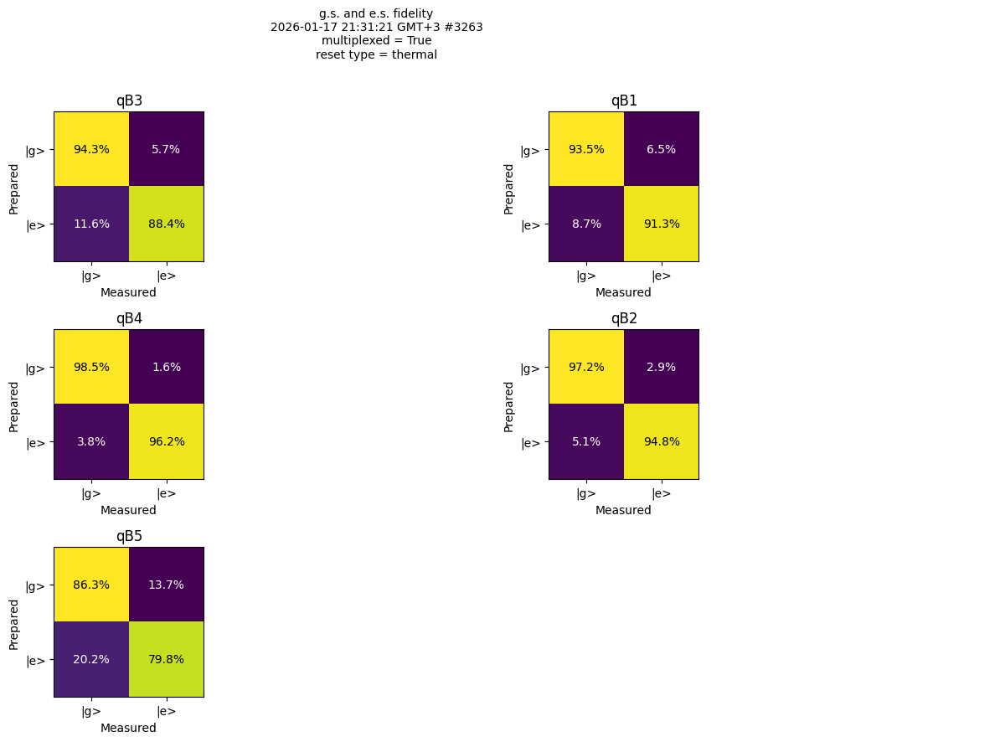

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


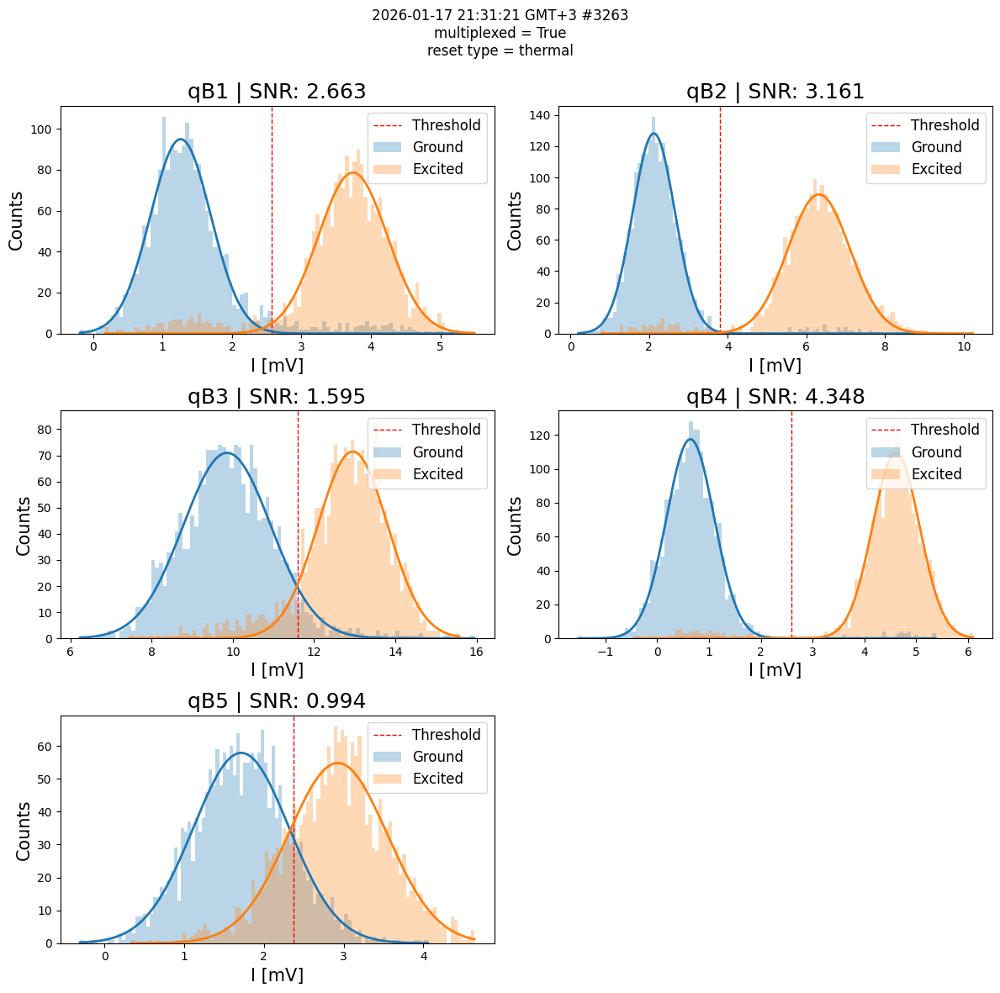

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=92.40%, SNR=2.66 F_est=95.41%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=96.00%, SNR=3.16 F_est=97.53%
qB3: Ps=-107.43 dBm, Tro=1500, Aro=0.06, F=91.40%, SNR=1.59 F_est=86.54%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.35%, SNR=4.35 F_est=97.67%
qB5: Ps=-112.11 dBm, Tro=1500, Aro=0.035, F=83.05%, SNR=0.99 F_est=64.90%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:31:46,919 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:31:49,517 - qm - INFO     - Opening QM
2026-01-17 20:31:49,519 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:31:51] QUA program submitted to arbel (id = f16423af-285b-4bbd-a695-3658228c6429)              ]8;id=66948;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=637602;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:31:52] Execution started                                                                       ]8;id=655646;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=688117;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:31:58] Execution finished                                                    

2026-01-17 20:31:58,116 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:31:58,117 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:31:58,270 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 358.1 deg | ge_threshold: 2.5 mV | rus_threshold: 1.4 mV | readout fidelity: 92.7 % 
 
2026-01-17 20:31:58,271 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 4.4 deg | ge_threshold: 3.6 mV | rus_threshold: 2.0 mV | readout fidelity: 95.8 % 
 
2026-01-17 20:31:58,273 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 337.9 deg | ge_threshold: 11.2 mV | rus_threshold: 9.7 mV | readout fidelity: 91.0 % 
 
2026-01-17 20:31:58,274 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 295.8 deg | ge_threshold: 2.4 mV | rus_threshold: 0.6 mV | readout fidelity: 97.4 % 
 
2026-01-17 20:31:58,275 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 126.5 deg | ge_threshold: 2.0 mV | rus_threshold: 1.4 mV | readout fidelity: 73.7 % 
 


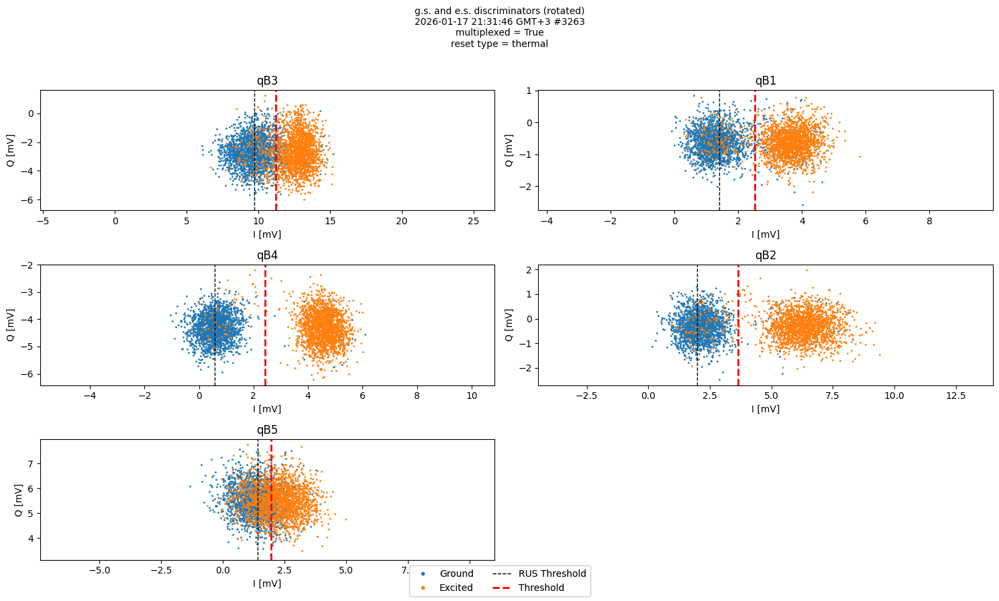

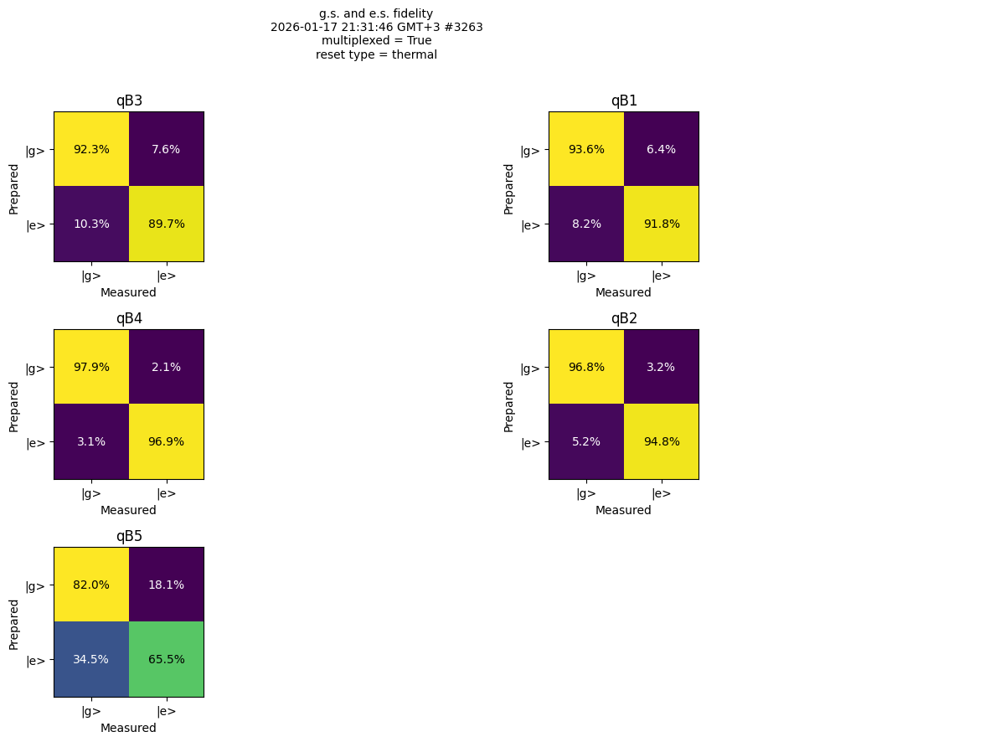

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


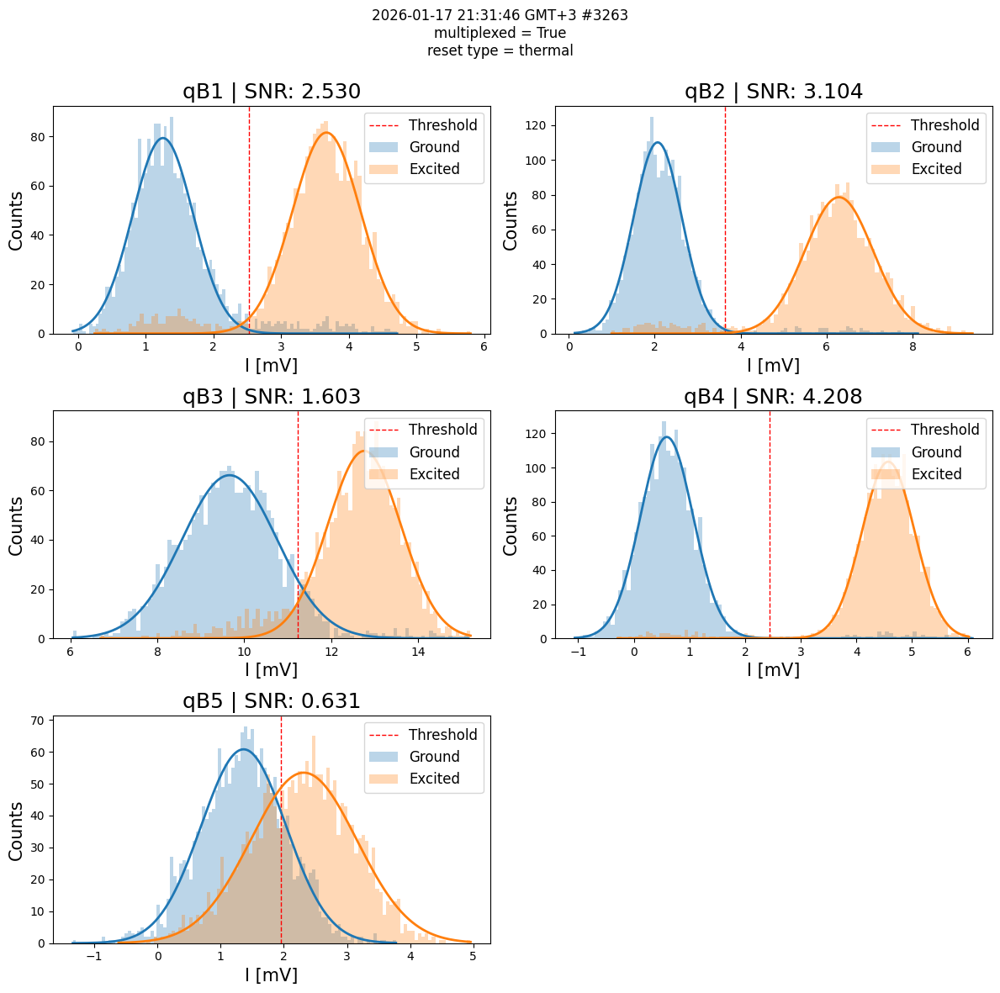

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=92.70%, SNR=2.53 F_est=95.05%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=95.75%, SNR=3.10 F_est=97.50%
qB3: Ps=-107.43 dBm, Tro=1500, Aro=0.06, F=91.03%, SNR=1.60 F_est=86.73%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.40%, SNR=4.21 F_est=97.66%
qB5: Ps=-109.93 dBm, Tro=1500, Aro=0.045, F=73.70%, SNR=0.63 F_est=45.07%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:37:30,632 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:37:33,259 - qm - INFO     - Opening QM
2026-01-17 20:37:33,260 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:37:35] QUA program submitted to arbel (id = 1a553554-f33e-42a0-b9f3-c215efaf7d3b)              ]8;id=66990;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=25523;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:38:36] Execution started                                                                       ]8;id=637807;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=596602;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:38:42] Execution finished                                                     

2026-01-17 20:38:42,746 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:38:42,749 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:38:42,976 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 358.6 deg | ge_threshold: 2.5 mV | rus_threshold: 1.4 mV | readout fidelity: 93.5 % 
 
2026-01-17 20:38:42,977 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 3.8 deg | ge_threshold: 4.0 mV | rus_threshold: 2.1 mV | readout fidelity: 96.5 % 
 
2026-01-17 20:38:42,979 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 331.6 deg | ge_threshold: 8.5 mV | rus_threshold: 7.1 mV | readout fidelity: 95.1 % 
 
2026-01-17 20:38:42,981 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 297.4 deg | ge_threshold: 2.4 mV | rus_threshold: 0.6 mV | readout fidelity: 97.2 % 
 
2026-01-17 20:38:42,982 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB5:  SUCCESS!
IW angle: 117.7 deg | ge_threshold: 2.4 mV | rus_threshold: 1.8 mV | readout fidelity: 84.3 % 
 


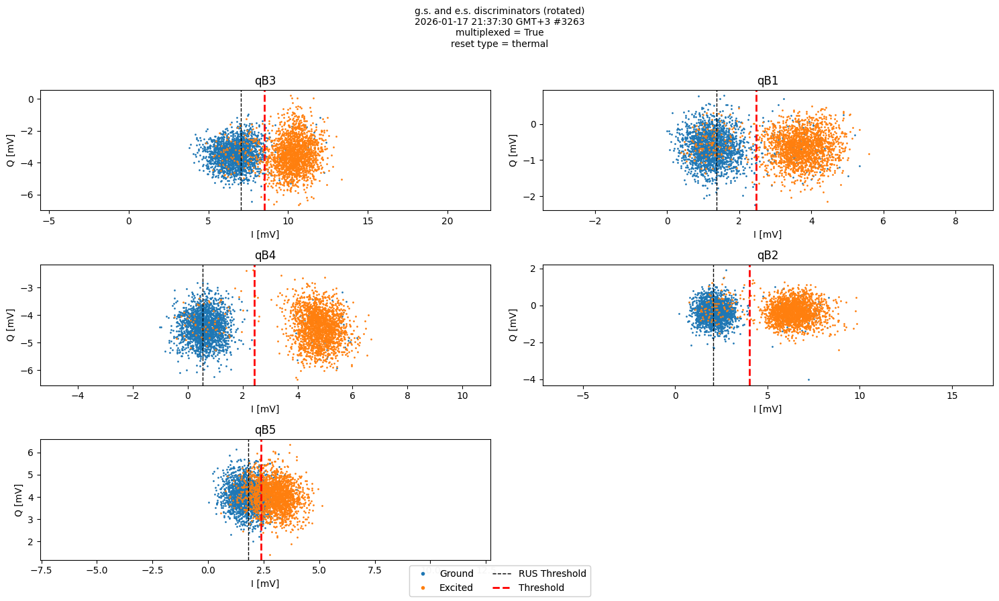

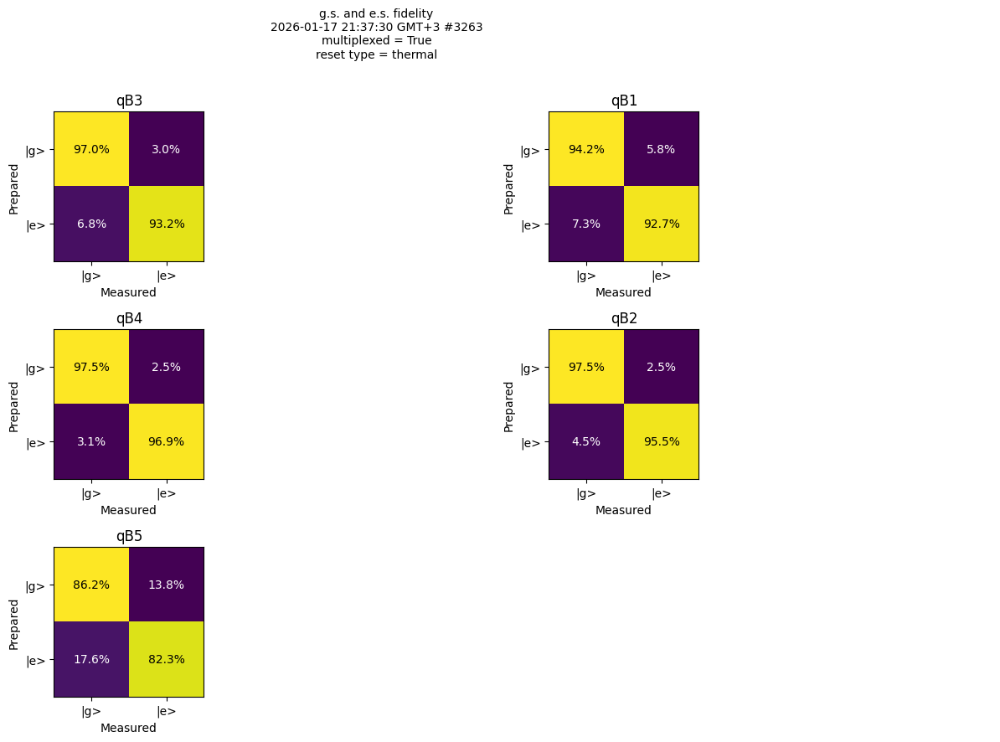

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


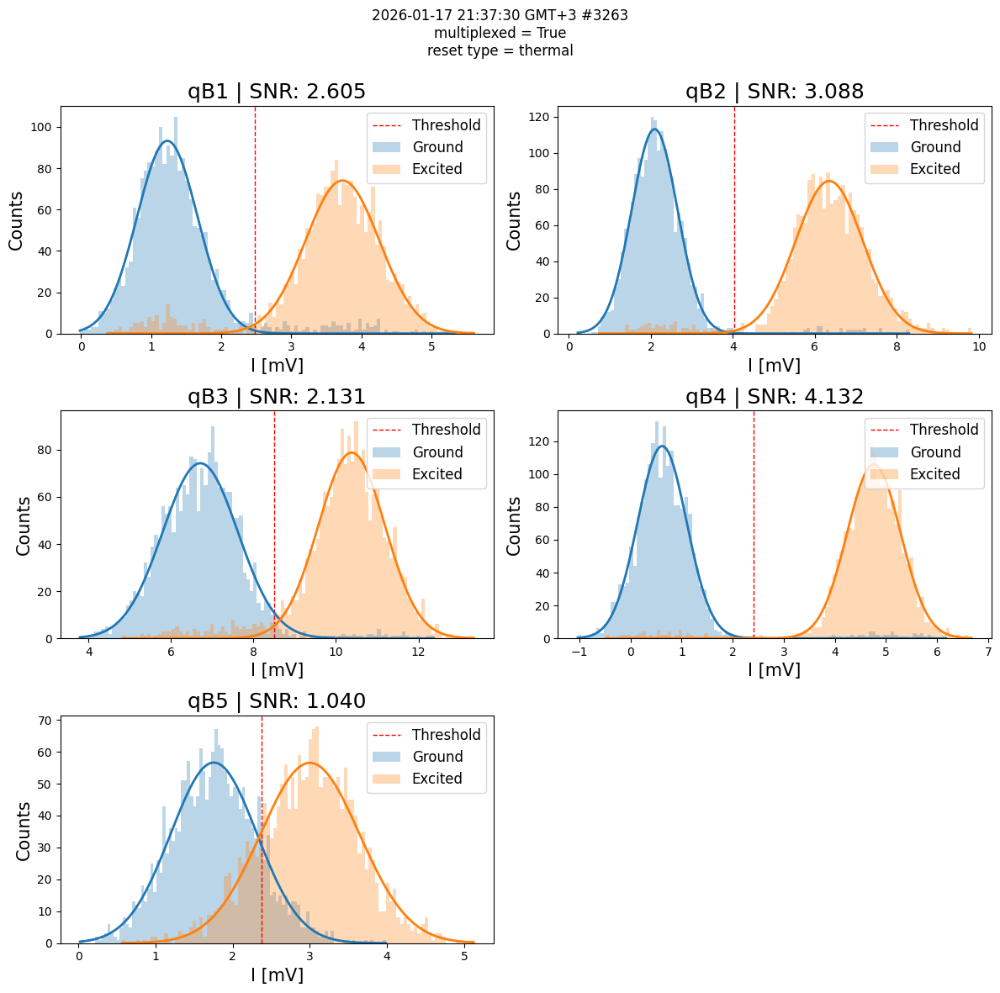

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=93.45%, SNR=2.61 F_est=95.27%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=96.50%, SNR=3.09 F_est=97.49%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=95.12%, SNR=2.13 F_est=94.10%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=97.15%, SNR=4.13 F_est=97.66%
qB5: Ps=-112.11 dBm, Tro=1500, Aro=0.035, F=84.30%, SNR=1.04 F_est=67.00%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:50:36,088 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:50:38,814 - qm - INFO     - Opening QM
2026-01-17 20:50:38,815 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:50:41] QUA program submitted to arbel (id = 3b49a43d-5cff-46bf-9358-33e727cdb18f)              ]8;id=687344;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=523214;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:50:42] Execution started                                                                       ]8;id=910329;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=310960;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:50:47] Execution finished                                                   

2026-01-17 20:50:47,216 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:50:47,217 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:50:47,382 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 348.8 deg | ge_threshold: 2.3 mV | rus_threshold: 1.4 mV | readout fidelity: 91.7 % 
 
2026-01-17 20:50:47,384 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 354.7 deg | ge_threshold: 4.2 mV | rus_threshold: 2.4 mV | readout fidelity: 95.4 % 
 
2026-01-17 20:50:47,386 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 331.6 deg | ge_threshold: 8.6 mV | rus_threshold: 7.2 mV | readout fidelity: 95.7 % 
 
2026-01-17 20:50:47,387 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 283.7 deg | ge_threshold: 1.8 mV | rus_threshold: 0.3 mV | readout fidelity: 96.2 % 
 


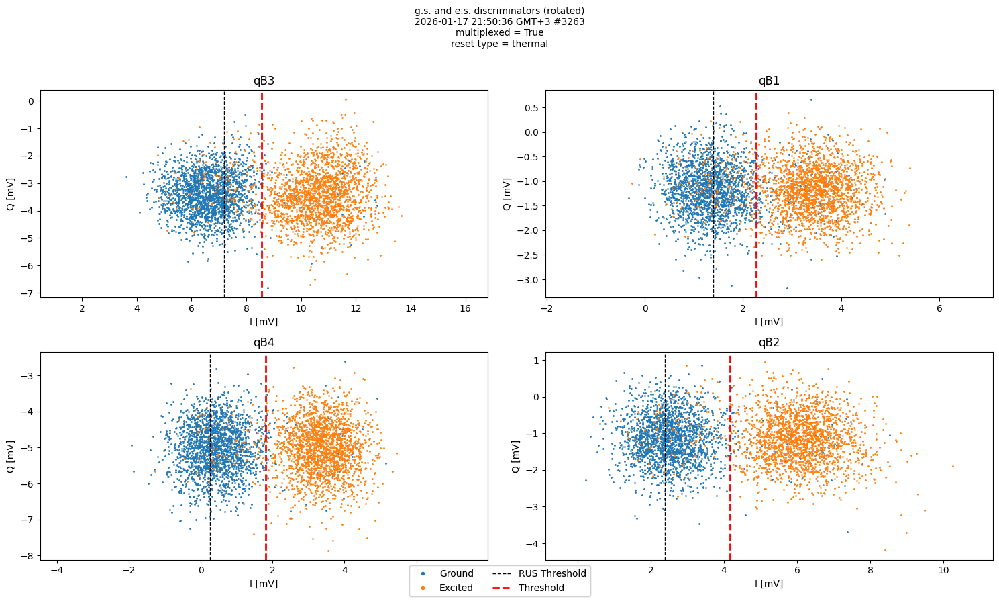

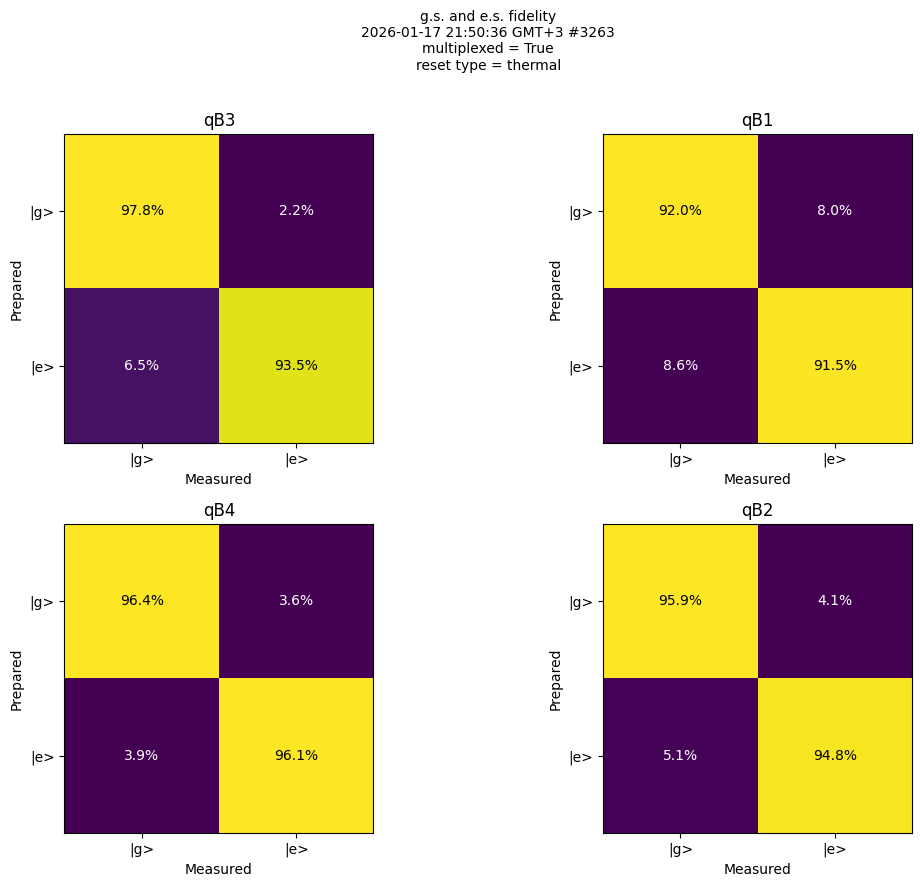

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


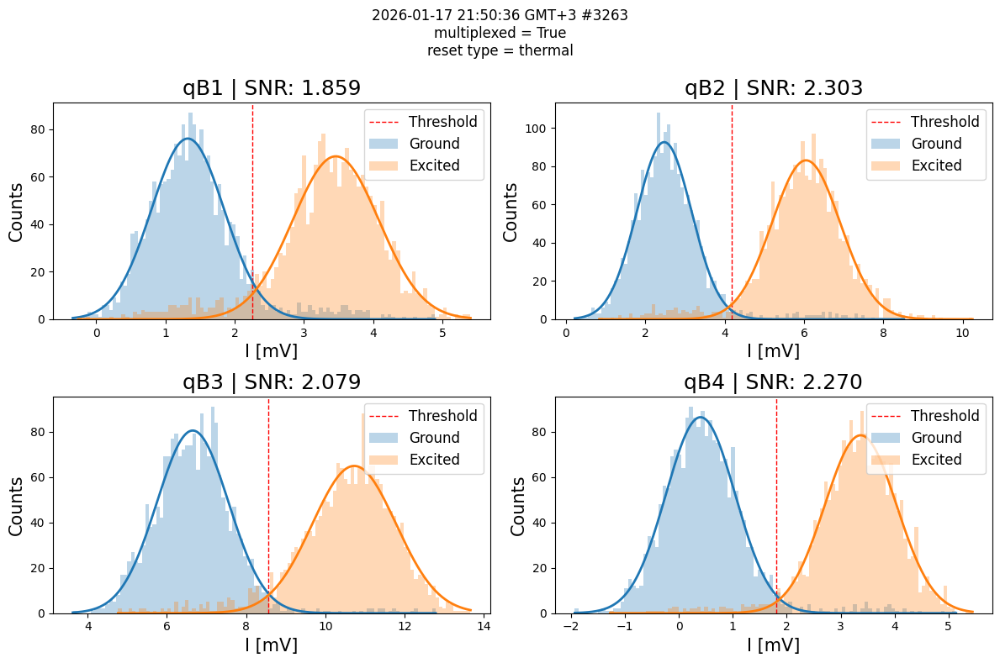

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1000, Aro=0.023, F=91.72%, SNR=1.86 F_est=91.28%
qB2: Ps=-113.45 dBm, Tro=1000, Aro=0.03, F=95.38%, SNR=2.30 F_est=96.36%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=95.67%, SNR=2.08 F_est=93.66%
qB4: Ps=-105.49 dBm, Tro=800, Aro=0.075, F=96.25%, SNR=2.27 F_est=96.46%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:51:34,731 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:51:38,809 - qm - INFO     - Opening QM
2026-01-17 20:51:38,810 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:51:41] QUA program submitted to arbel (id = 7043bc65-f2fc-4f5f-bc9f-4868b93e198e)              ]8;id=243317;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=264260;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
           Execution started                                                                       ]8;id=356775;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=777311;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:51:47] Execution finished                                                   

2026-01-17 20:51:47,439 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:51:47,442 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:51:47,714 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 351.9 deg | ge_threshold: 2.4 mV | rus_threshold: 1.5 mV | readout fidelity: 91.8 % 
 
2026-01-17 20:51:47,717 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 351.9 deg | ge_threshold: 4.3 mV | rus_threshold: 2.8 mV | readout fidelity: 94.6 % 
 
2026-01-17 20:51:47,719 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 331.6 deg | ge_threshold: 8.6 mV | rus_threshold: 6.8 mV | readout fidelity: 95.3 % 
 
2026-01-17 20:51:47,721 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 280.4 deg | ge_threshold: 1.8 mV | rus_threshold: 0.7 mV | readout fidelity: 94.0 % 
 


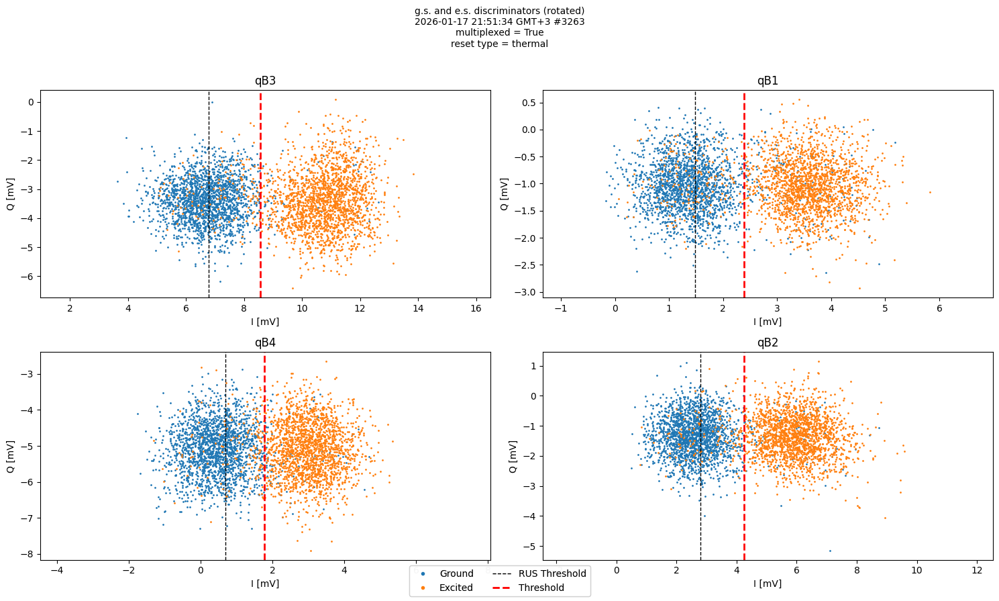

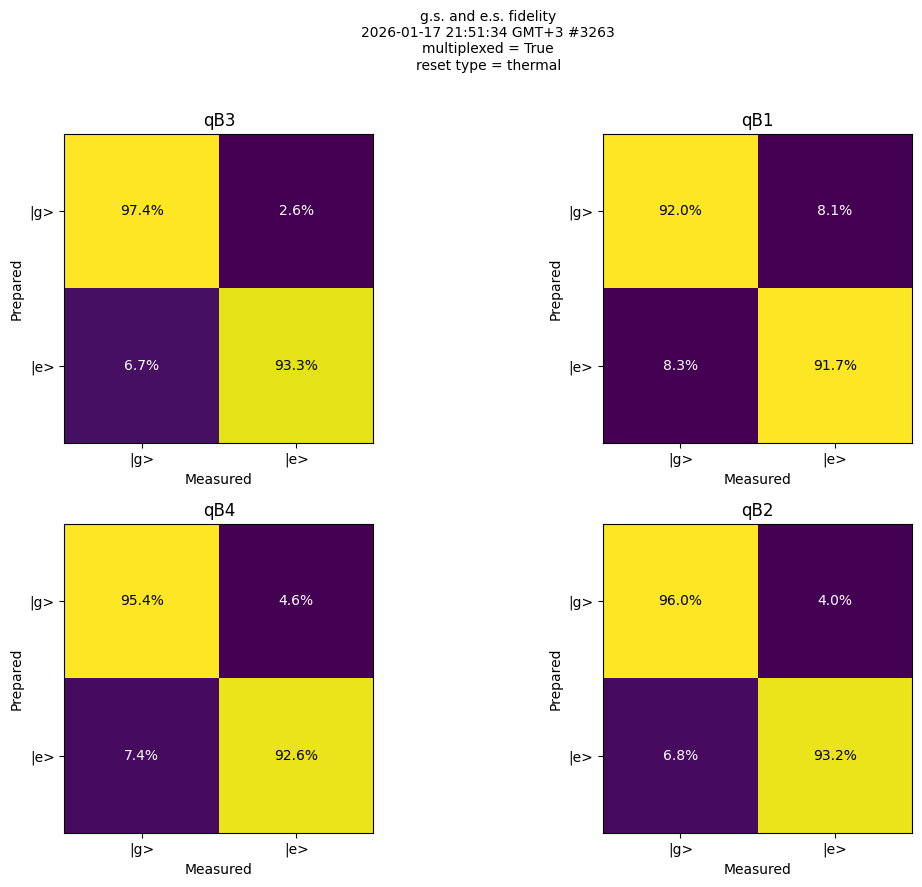

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


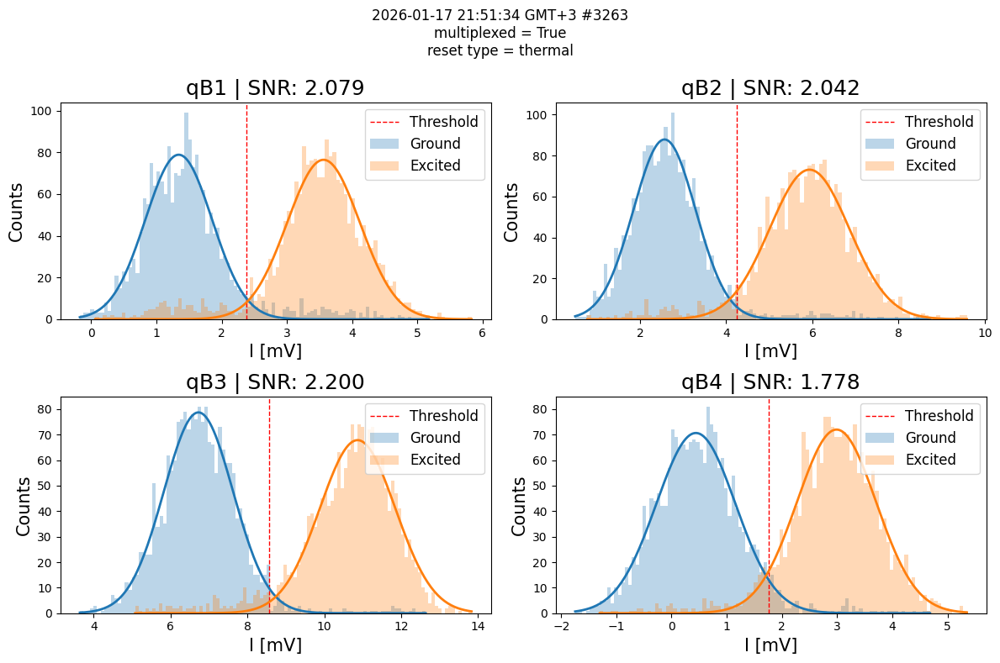

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1100, Aro=0.023, F=91.83%, SNR=2.08 F_est=93.50%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=94.62%, SNR=2.04 F_est=94.55%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=95.35%, SNR=2.20 F_est=94.62%
qB4: Ps=-105.49 dBm, Tro=700, Aro=0.075, F=94.00%, SNR=1.78 F_est=91.44%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:52:01,513 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:52:04,022 - qm - INFO     - Opening QM
2026-01-17 20:52:04,023 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:52:06] QUA program submitted to arbel (id = 12cc0865-5e0e-4e3c-8241-c627de3fc345)              ]8;id=269518;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=383572;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:52:07] Execution started                                                                       ]8;id=683241;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=583697;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:52:12] Execution finished                                                   

2026-01-17 20:52:12,468 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:52:12,470 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:52:12,598 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 351.2 deg | ge_threshold: 2.4 mV | rus_threshold: 1.3 mV | readout fidelity: 92.9 % 
 
2026-01-17 20:52:12,600 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 352.1 deg | ge_threshold: 4.2 mV | rus_threshold: 2.4 mV | readout fidelity: 94.8 % 
 
2026-01-17 20:52:12,601 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 331.7 deg | ge_threshold: 8.4 mV | rus_threshold: 6.5 mV | readout fidelity: 94.6 % 
 
2026-01-17 20:52:12,603 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 283.5 deg | ge_threshold: 2.1 mV | rus_threshold: 0.7 mV | readout fidelity: 96.4 % 
 


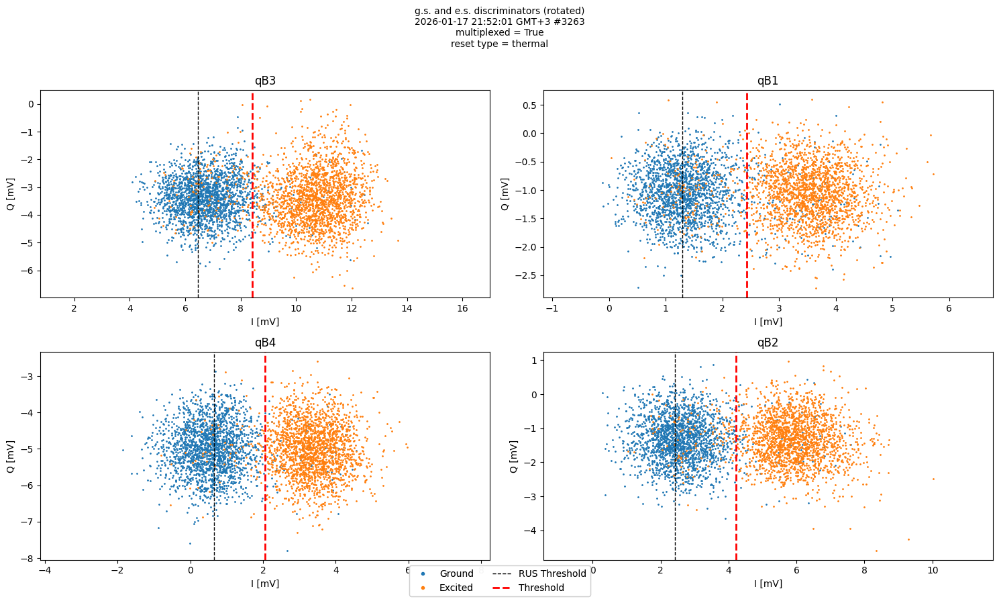

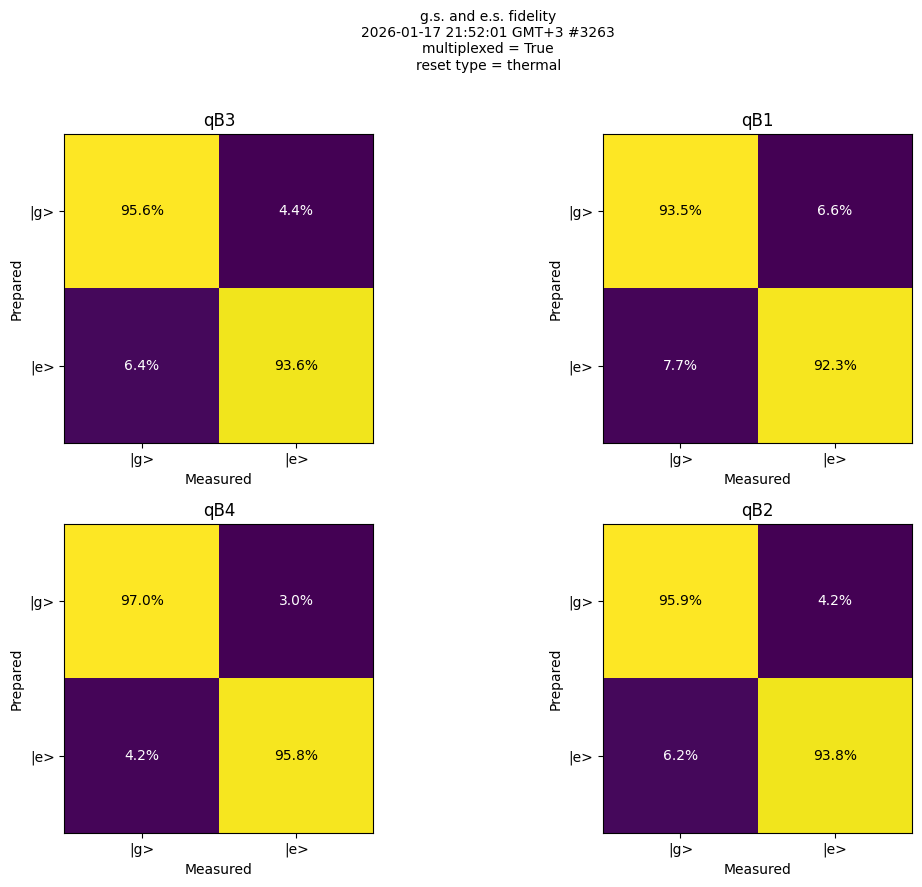

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


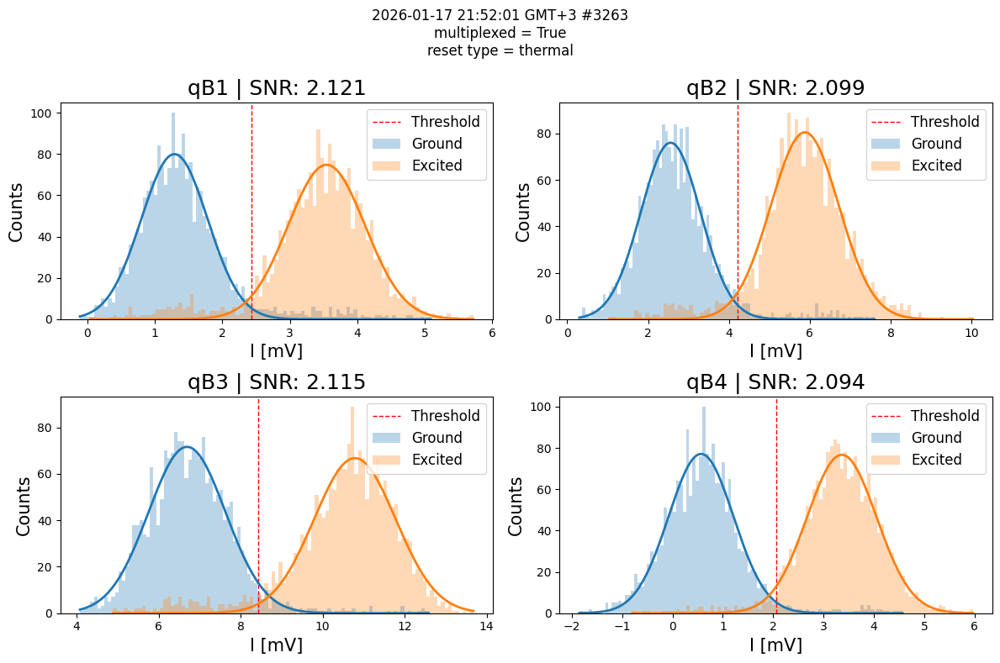

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1100, Aro=0.023, F=92.88%, SNR=2.12 F_est=93.86%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=94.80%, SNR=2.10 F_est=95.07%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=94.60%, SNR=2.11 F_est=93.97%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.40%, SNR=2.09 F_est=95.20%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 20:52:20,313 - INFO - Saving node with snapshot index 3263
2026-01-17 20:52:20,320 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 20:52:20,780 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 20:52:20,827 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3263_07_iq_blobs_205220\quam_state
2026-01-17 20:52:20,878 - INFO - Node saved locally
2026-01-17 20:52:20,884 - INFO - Found quantum computer backend: arbel
2026-01-17 20:52:29,925 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "active"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:52:30,195 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:52:34,267 - qm - INFO     - Opening QM
2026-01-17 20:52:34,269 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:52:38] QUA program submitted to arbel (id = 02d69b55-d6ad-46a4-9727-1df73dd7bc9c)              ]8;id=561025;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=632763;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:52:39] Execution started                                                                       ]8;id=575585;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=587035;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:52:46] Execution finished                                                   

2026-01-17 20:52:46,712 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:52:46,713 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:52:46,852 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 0.4 deg | ge_threshold: 2.4 mV | rus_threshold: 1.4 mV | readout fidelity: 91.7 % 
 
2026-01-17 20:52:46,854 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 359.7 deg | ge_threshold: 4.1 mV | rus_threshold: 2.8 mV | readout fidelity: 95.7 % 
 
2026-01-17 20:52:46,857 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 0.9 deg | ge_threshold: 8.5 mV | rus_threshold: 6.6 mV | readout fidelity: 94.8 % 
 
2026-01-17 20:52:46,857 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 0.4 deg | ge_threshold: 1.9 mV | rus_threshold: 0.7 mV | readout fidelity: 97.4 % 
 


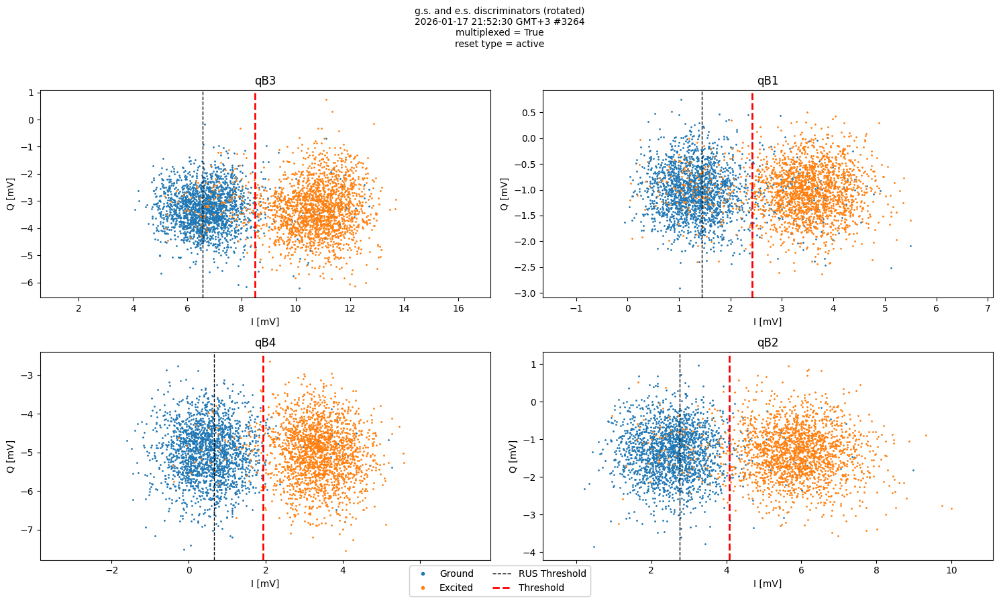

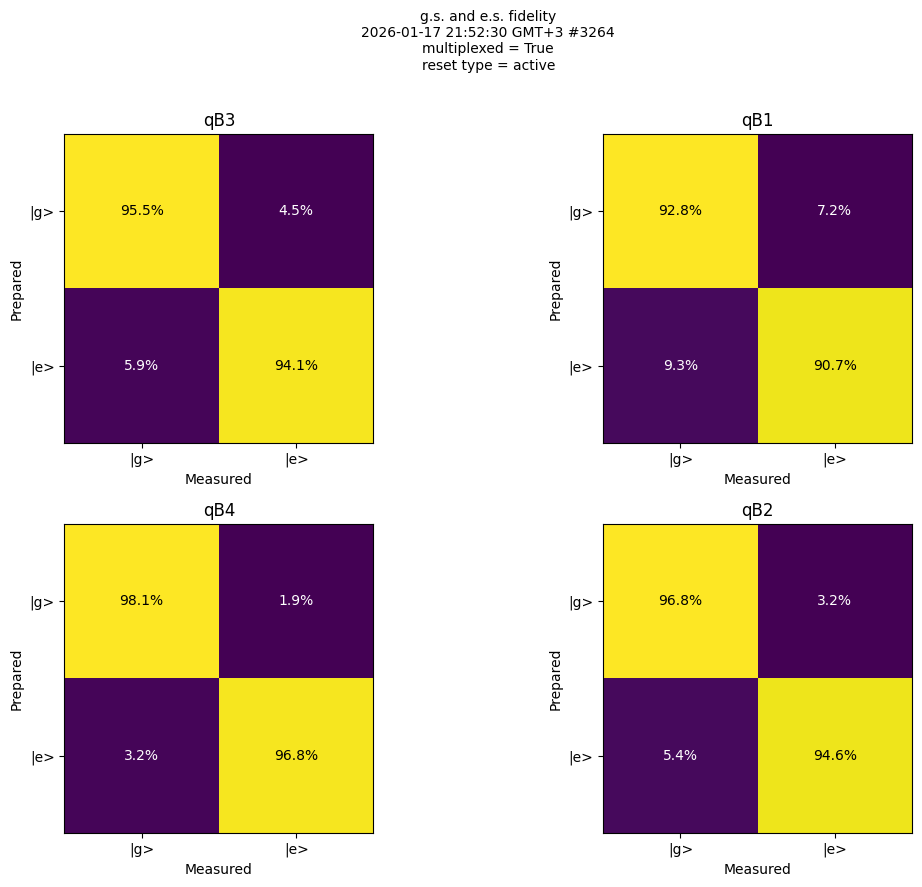

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


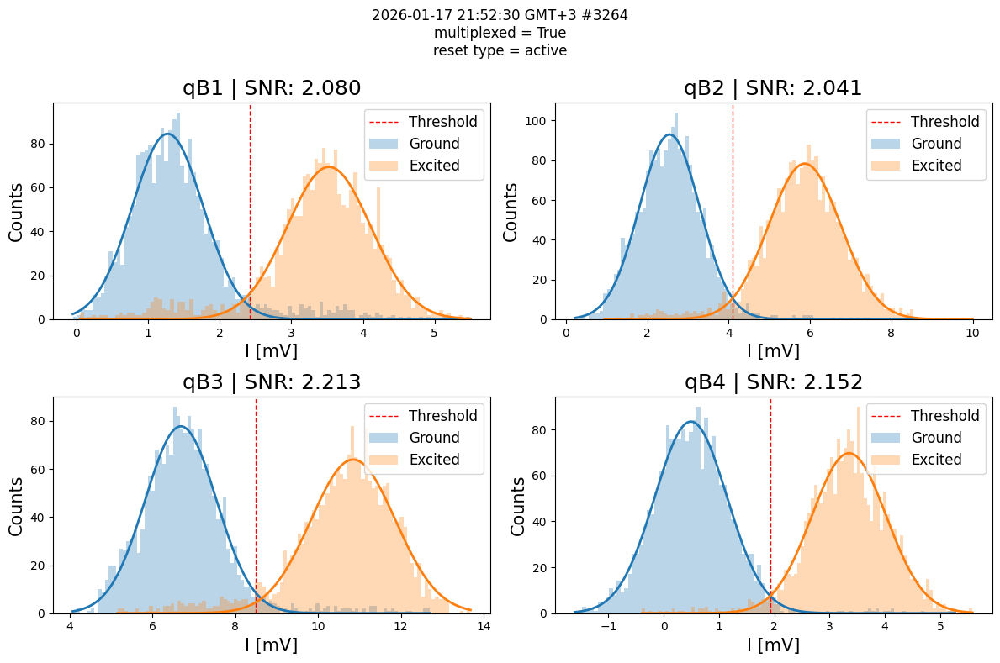

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1100, Aro=0.023, F=91.72%, SNR=2.08 F_est=93.51%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=95.70%, SNR=2.04 F_est=94.54%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=94.77%, SNR=2.21 F_est=94.70%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=97.45%, SNR=2.15 F_est=95.68%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 20:53:03,206 - INFO - Saving node with snapshot index 3264
2026-01-17 20:53:03,217 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 20:53:03,609 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 20:53:03,657 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3264_07_iq_blobs_205303\quam_state
2026-01-17 20:53:03,705 - INFO - Node saved locally
2026-01-17 20:53:03,709 - INFO - Found quantum computer backend: arbel
2026-01-17 20:53:11,014 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:55:41,380 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:55:44,180 - qm - INFO     - Opening QM
2026-01-17 20:55:44,181 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:55:46] QUA program submitted to arbel (id = 6f6276da-d24a-4760-848f-85ed8993600b)              ]8;id=399015;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=472959;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:55:48] Execution started                                                                       ]8;id=373445;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=129207;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:55:52] Execution finished                                                   

2026-01-17 20:55:52,954 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:55:52,957 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:55:53,117 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 307.9 deg | ge_threshold: 1.9 mV | rus_threshold: 1.0 mV | readout fidelity: 94.0 % 
 
2026-01-17 20:55:53,119 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 339.4 deg | ge_threshold: 2.1 mV | rus_threshold: 1.3 mV | readout fidelity: 96.1 % 
 
2026-01-17 20:55:53,120 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 314.0 deg | ge_threshold: 4.9 mV | rus_threshold: 3.8 mV | readout fidelity: 96.3 % 
 
2026-01-17 20:55:53,121 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 331.3 deg | ge_threshold: 0.7 mV | rus_threshold: 0.0 mV | readout fidelity: 96.0 % 
 


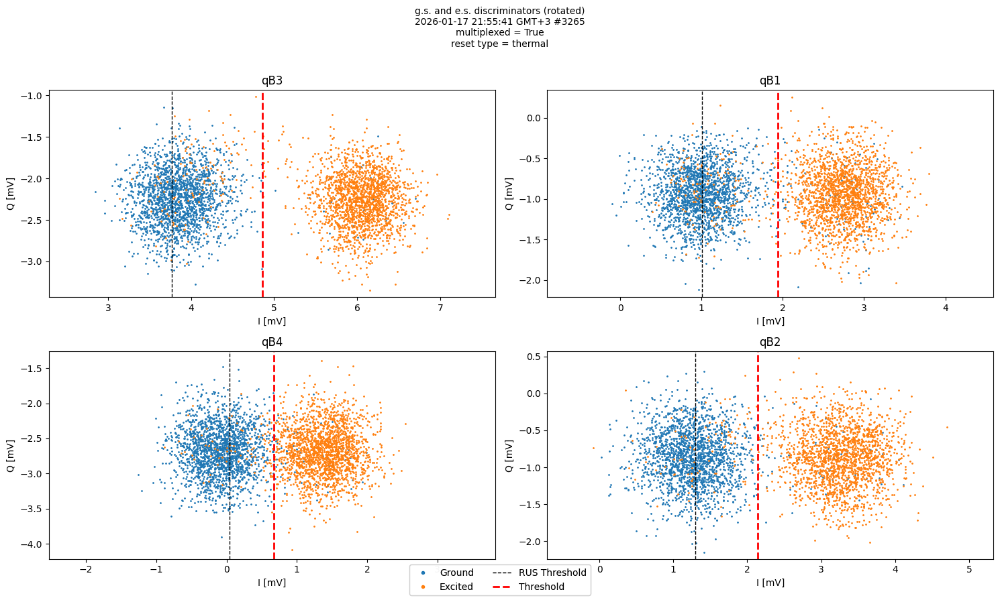

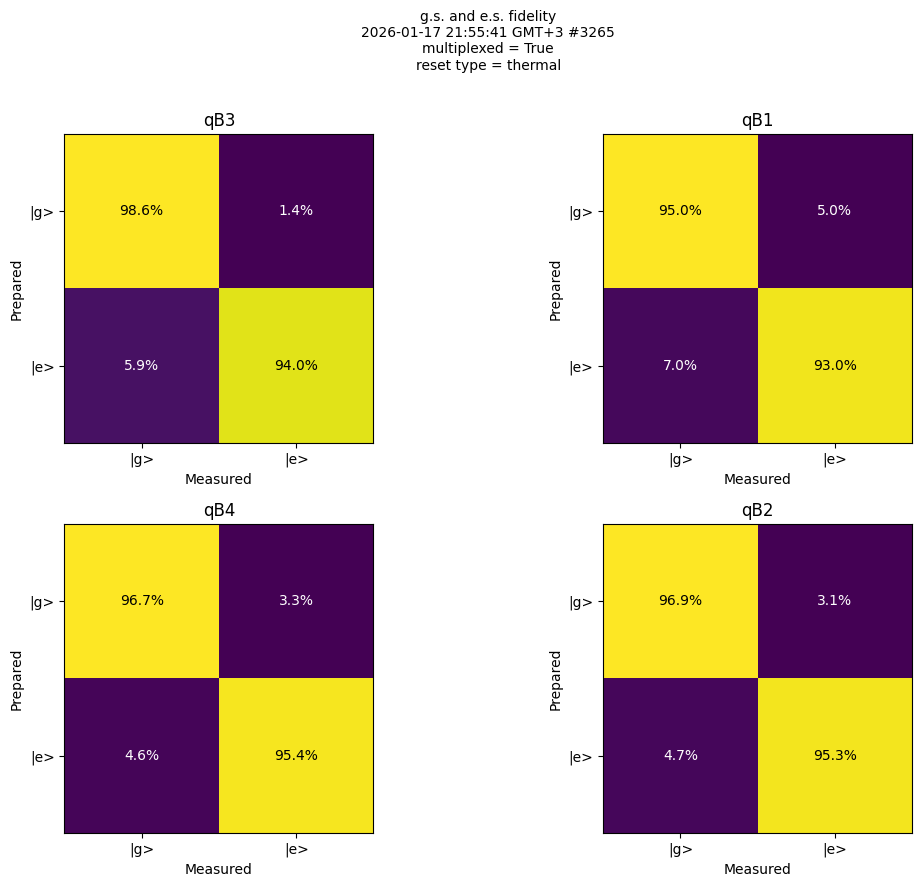

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


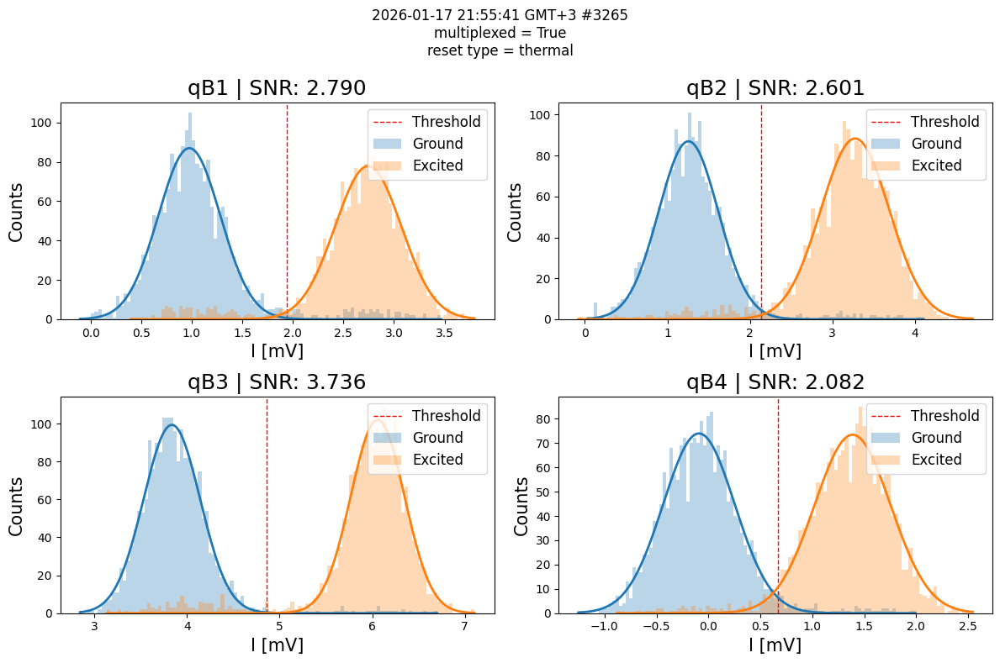

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1100, Aro=0.023, F=94.03%, SNR=2.79 F_est=96.65%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=96.12%, SNR=2.60 F_est=97.69%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=96.32%, SNR=3.74 F_est=97.31%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.05%, SNR=2.08 F_est=95.09%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:56:45,266 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:56:47,723 - qm - INFO     - Opening QM
2026-01-17 20:56:47,724 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:56:53] QUA program submitted to arbel (id = 17cc5196-bff6-4374-a8d9-3a45e0b4029b)              ]8;id=946885;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=16155;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:56:54] Execution started                                                                       ]8;id=767170;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=894811;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:56:58] Execution finished                                                    

2026-01-17 20:56:58,936 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:56:58,938 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:56:59,080 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 306.2 deg | ge_threshold: 1.9 mV | rus_threshold: 1.1 mV | readout fidelity: 94.2 % 
 
2026-01-17 20:56:59,081 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 338.9 deg | ge_threshold: 2.1 mV | rus_threshold: 1.3 mV | readout fidelity: 96.3 % 
 
2026-01-17 20:56:59,082 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 289.8 deg | ge_threshold: 3.4 mV | rus_threshold: 2.6 mV | readout fidelity: 96.6 % 
 
2026-01-17 20:56:59,084 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 332.0 deg | ge_threshold: 0.7 mV | rus_threshold: -0.1 mV | readout fidelity: 96.0 % 
 


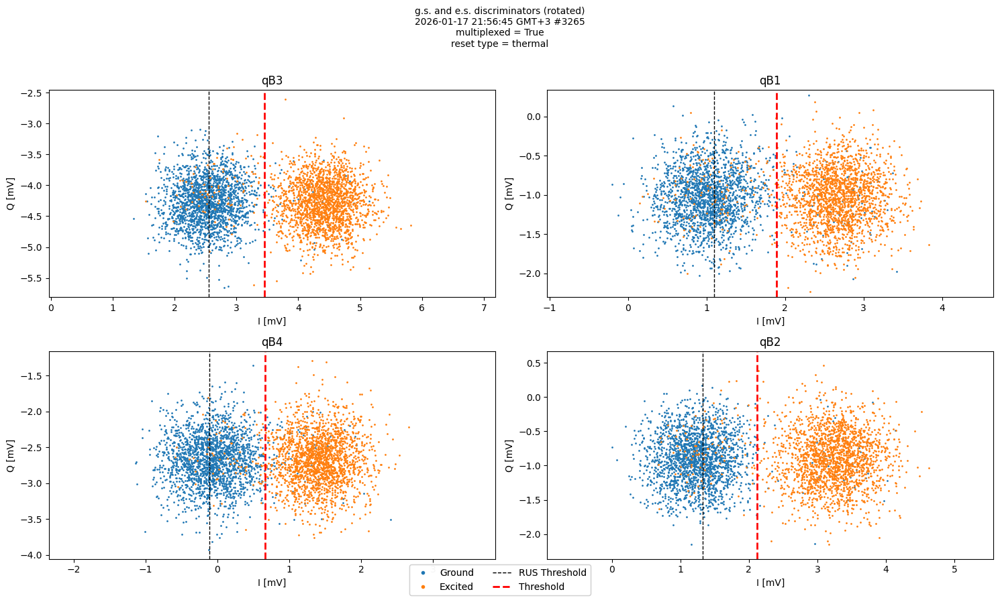

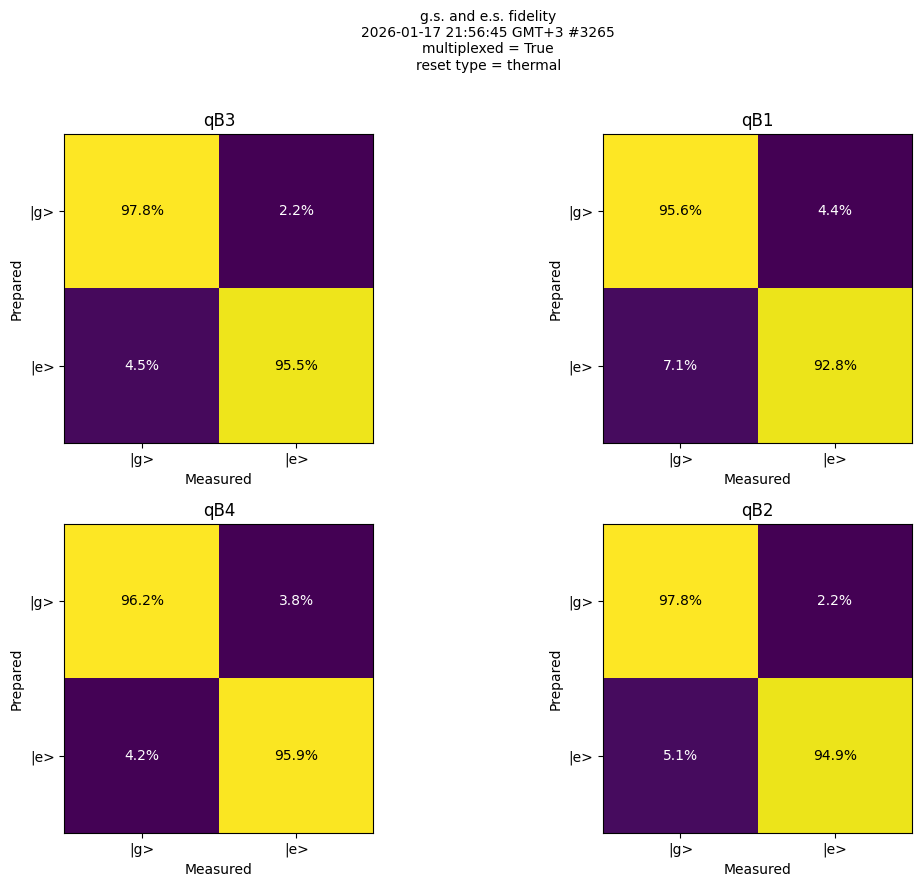

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


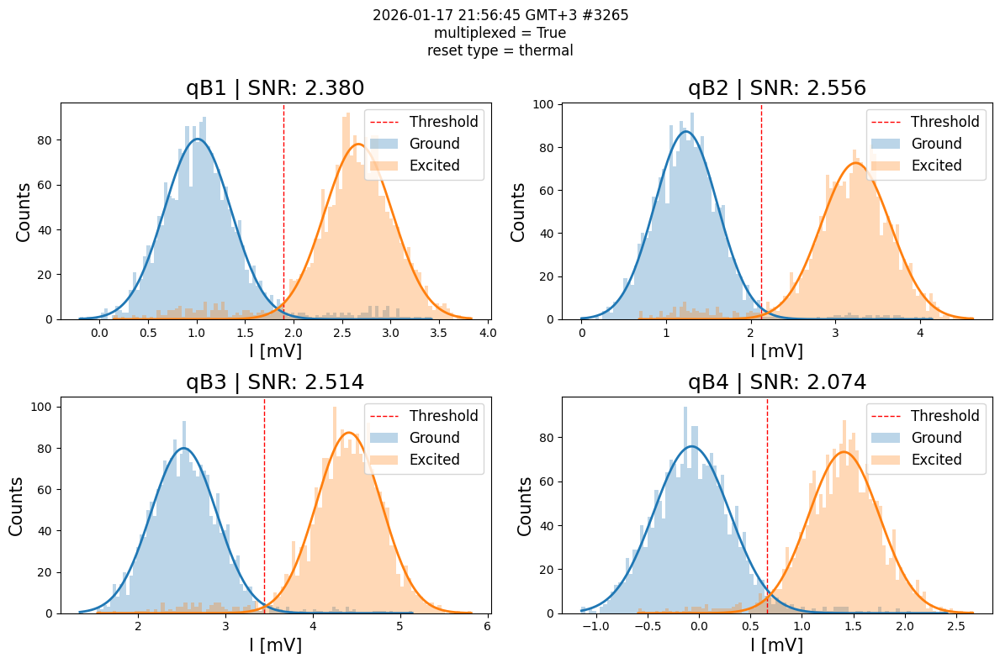

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1000, Aro=0.023, F=94.23%, SNR=2.38 F_est=95.73%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=96.32%, SNR=2.56 F_est=97.56%
qB3: Ps=-109.01 dBm, Tro=1000, Aro=0.05, F=96.62%, SNR=2.51 F_est=97.04%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.05%, SNR=2.07 F_est=95.02%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:57:28,655 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:57:31,219 - qm - INFO     - Opening QM
2026-01-17 20:57:31,221 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:57:33] QUA program submitted to arbel (id = a6915a00-ed72-48d8-99d2-9320ccddfa00)              ]8;id=137820;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=573091;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:57:34] Execution started                                                                       ]8;id=730685;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=800598;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:57:39] Execution finished                                                   

2026-01-17 20:57:39,840 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:57:39,842 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:57:40,011 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 302.8 deg | ge_threshold: 1.8 mV | rus_threshold: 1.0 mV | readout fidelity: 94.0 % 
 
2026-01-17 20:57:40,013 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 339.4 deg | ge_threshold: 2.1 mV | rus_threshold: 1.3 mV | readout fidelity: 95.8 % 
 
2026-01-17 20:57:40,014 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 285.4 deg | ge_threshold: 3.1 mV | rus_threshold: 2.2 mV | readout fidelity: 96.2 % 
 
2026-01-17 20:57:40,015 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 332.7 deg | ge_threshold: 0.7 mV | rus_threshold: -0.0 mV | readout fidelity: 96.3 % 
 


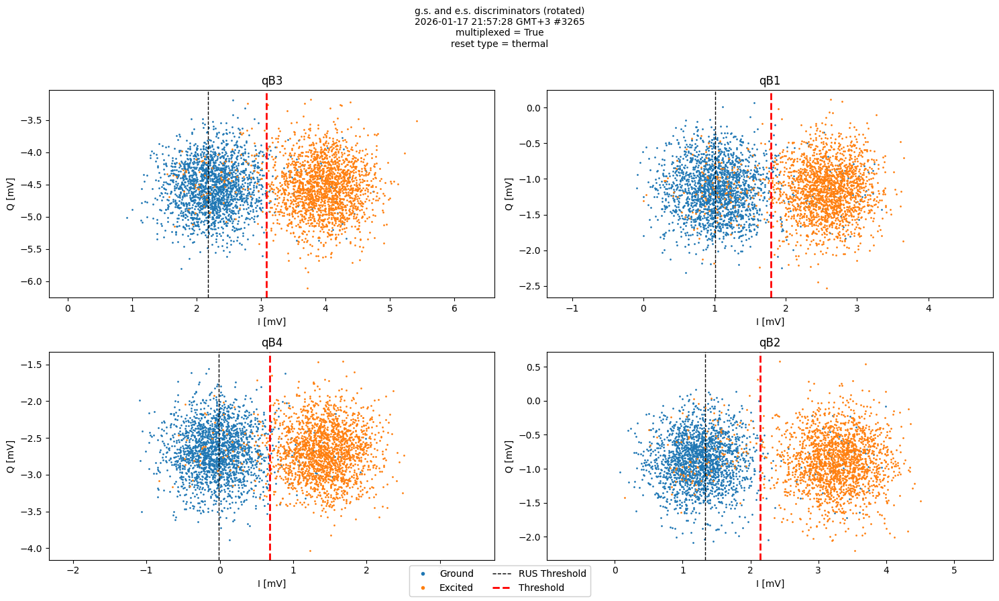

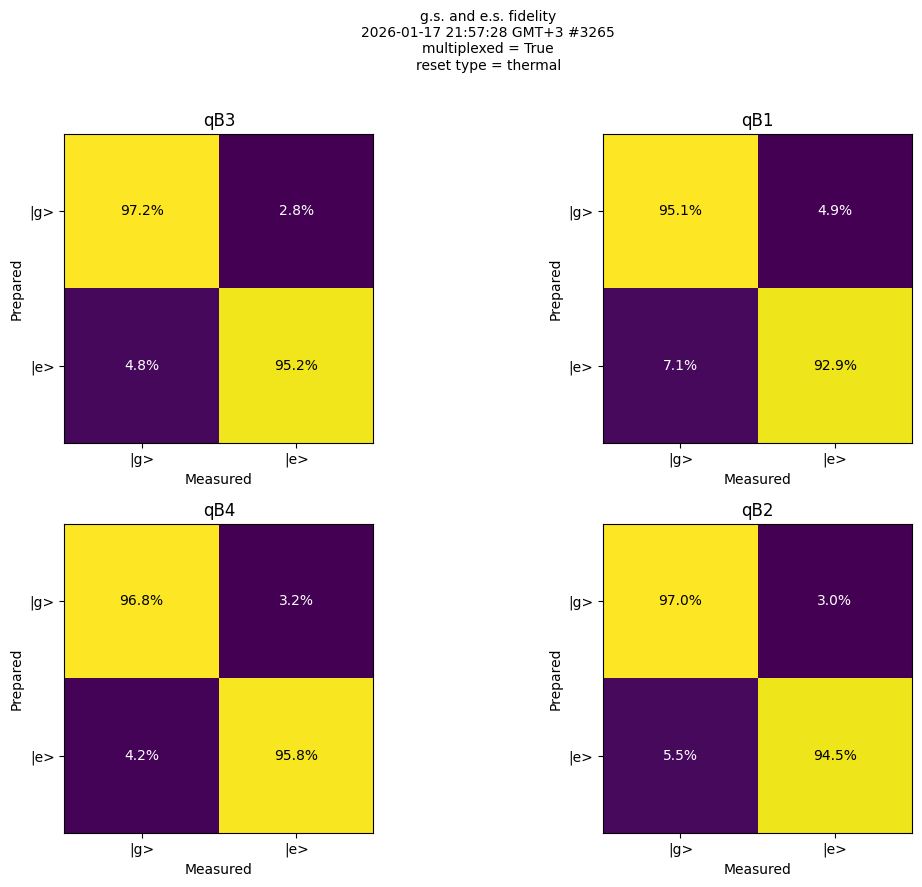

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


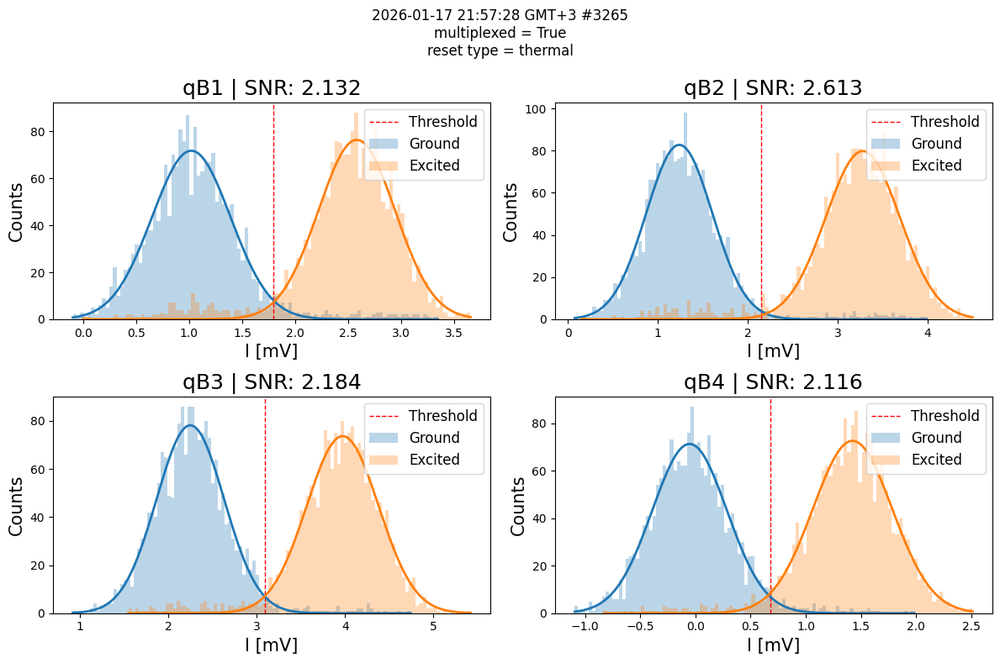

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=900, Aro=0.023, F=94.00%, SNR=2.13 F_est=94.45%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=95.78%, SNR=2.61 F_est=97.72%
qB3: Ps=-109.01 dBm, Tro=900, Aro=0.05, F=96.20%, SNR=2.18 F_est=95.54%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.28%, SNR=2.12 F_est=95.39%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 20:58:12,866 - INFO - Saving node with snapshot index 3265
2026-01-17 20:58:12,876 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 20:58:13,236 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 20:58:13,290 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3265_07_iq_blobs_205812\quam_state
2026-01-17 20:58:13,345 - INFO - Node saved locally
2026-01-17 20:58:13,347 - INFO - Found quantum computer backend: arbel
2026-01-17 20:58:21,688 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:58:23,489 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:58:27,208 - qm - INFO     - Opening QM
2026-01-17 20:58:27,209 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:58:29] QUA program submitted to arbel (id = bc77f596-5f8c-4320-b8b9-fb01861a4f0f)              ]8;id=4363;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=793959;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:58:30] Execution started                                                                       ]8;id=750907;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=415807;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:58:35] Execution finished                                                     

2026-01-17 20:58:35,188 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:58:35,190 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:58:35,350 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 0.0 deg | ge_threshold: 1.7 mV | rus_threshold: 1.1 mV | readout fidelity: 93.2 % 
 
2026-01-17 20:58:35,352 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 356.6 deg | ge_threshold: 2.1 mV | rus_threshold: 1.3 mV | readout fidelity: 95.8 % 
 
2026-01-17 20:58:35,353 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 0.3 deg | ge_threshold: 3.1 mV | rus_threshold: 2.2 mV | readout fidelity: 96.1 % 
 
2026-01-17 20:58:35,354 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 0.7 deg | ge_threshold: 0.7 mV | rus_threshold: 0.1 mV | readout fidelity: 96.3 % 
 


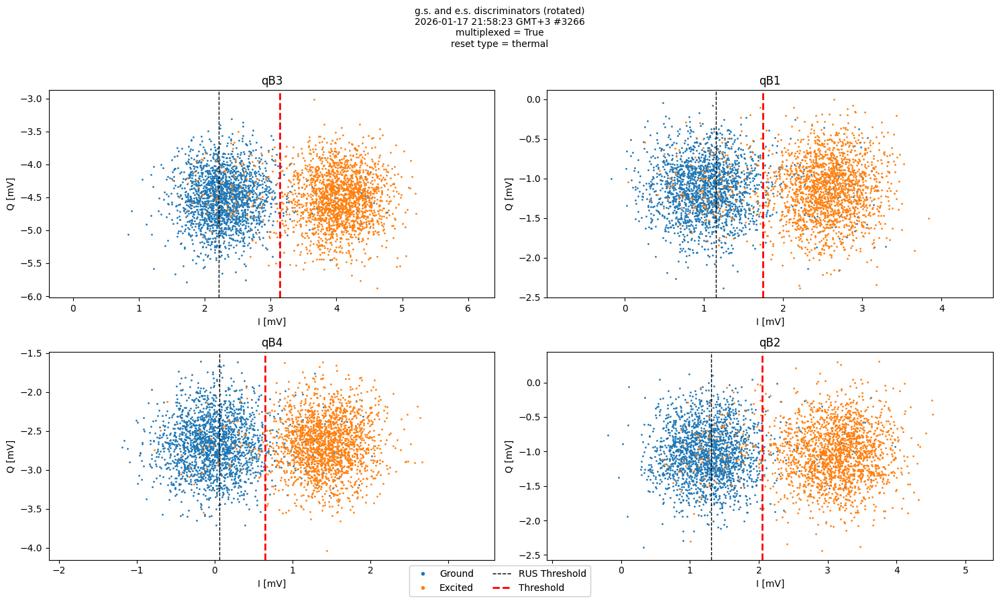

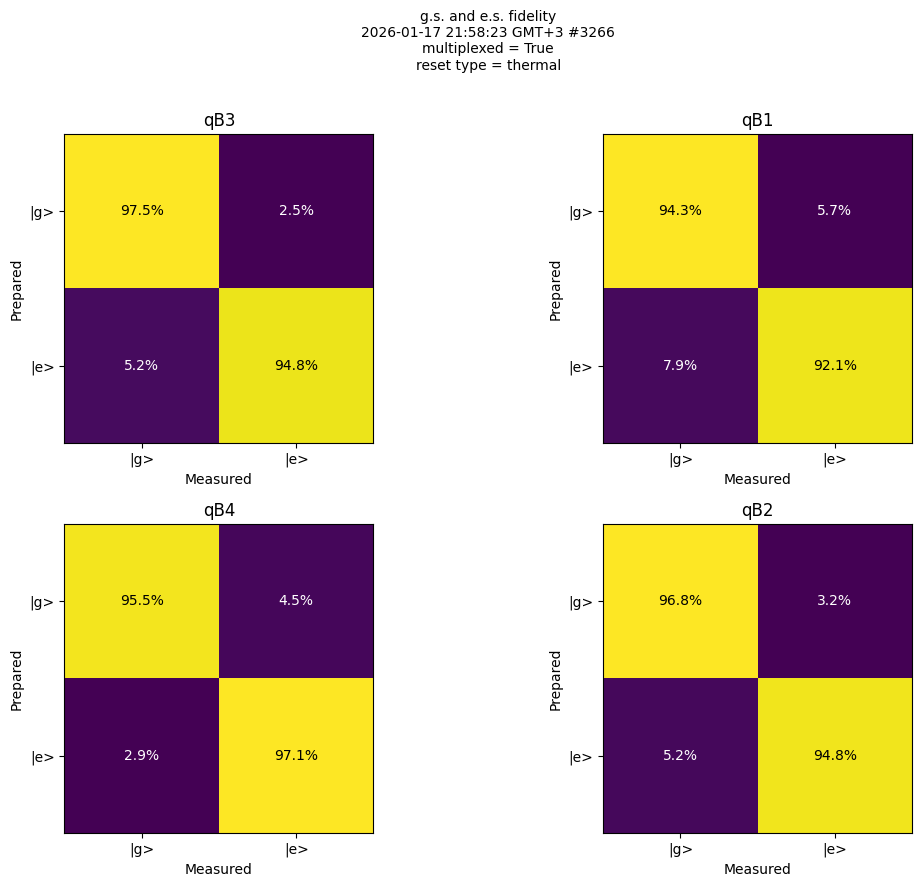

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


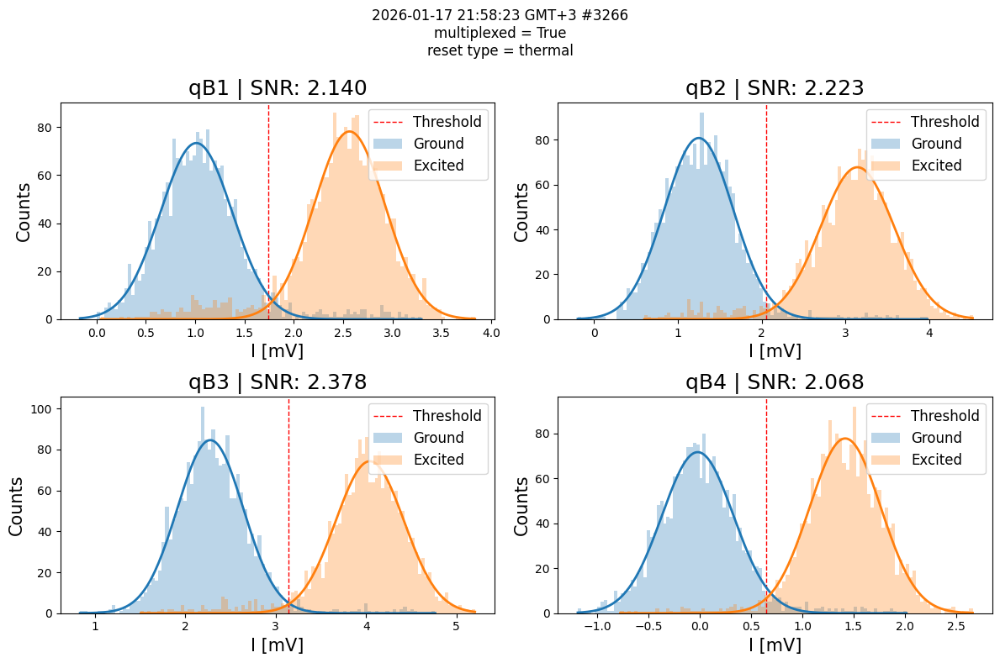

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=900, Aro=0.023, F=93.23%, SNR=2.14 F_est=94.51%
qB2: Ps=-113.45 dBm, Tro=800, Aro=0.03, F=95.78%, SNR=2.22 F_est=96.17%
qB3: Ps=-109.01 dBm, Tro=900, Aro=0.05, F=96.10%, SNR=2.38 F_est=96.67%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.30%, SNR=2.07 F_est=94.97%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:59:18,431 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:59:22,118 - qm - INFO     - Opening QM
2026-01-17 20:59:22,120 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:59:24] QUA program submitted to arbel (id = bec48441-e014-4456-a6ea-c65f06f36363)              ]8;id=488755;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=295526;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:59:25] Execution started                                                                       ]8;id=407856;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=812744;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:59:33] Execution finished                                                   

2026-01-17 20:59:33,274 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:59:33,276 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:59:33,421 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 1.1 deg | ge_threshold: 1.8 mV | rus_threshold: 0.9 mV | readout fidelity: 93.5 % 
 
2026-01-17 20:59:33,423 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 357.1 deg | ge_threshold: 2.1 mV | rus_threshold: 1.4 mV | readout fidelity: 95.6 % 
 
2026-01-17 20:59:33,424 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 355.6 deg | ge_threshold: 2.8 mV | rus_threshold: 2.1 mV | readout fidelity: 94.8 % 
 
2026-01-17 20:59:33,425 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 359.2 deg | ge_threshold: 0.7 mV | rus_threshold: -0.1 mV | readout fidelity: 96.0 % 
 


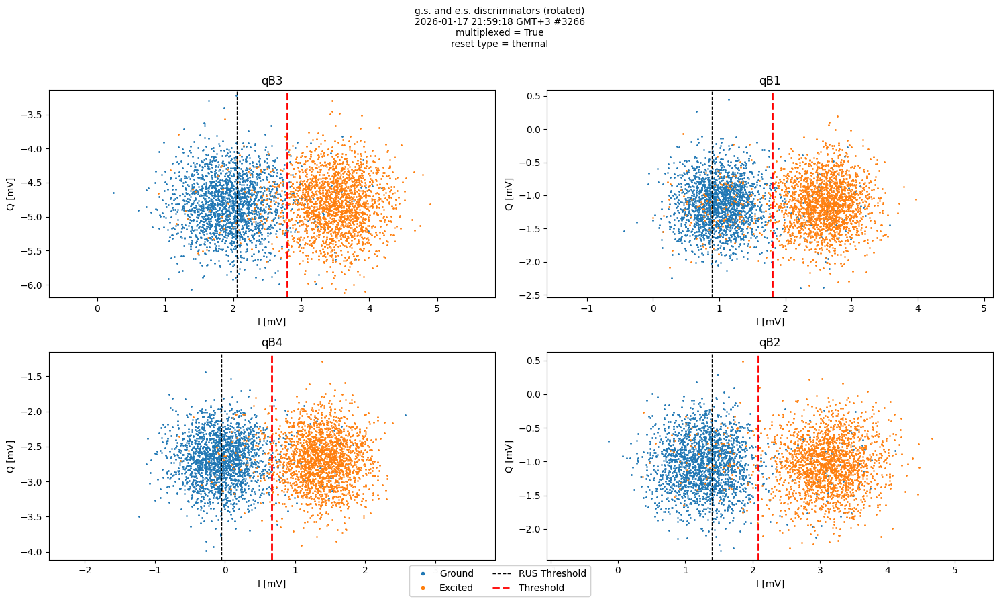

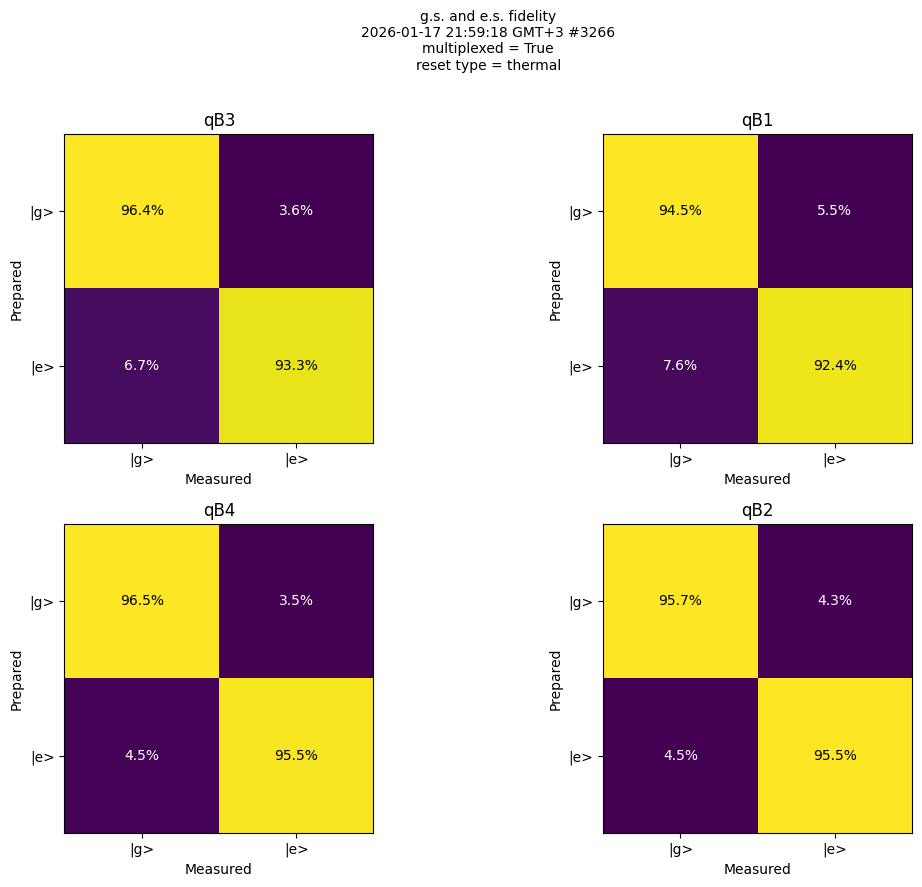

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


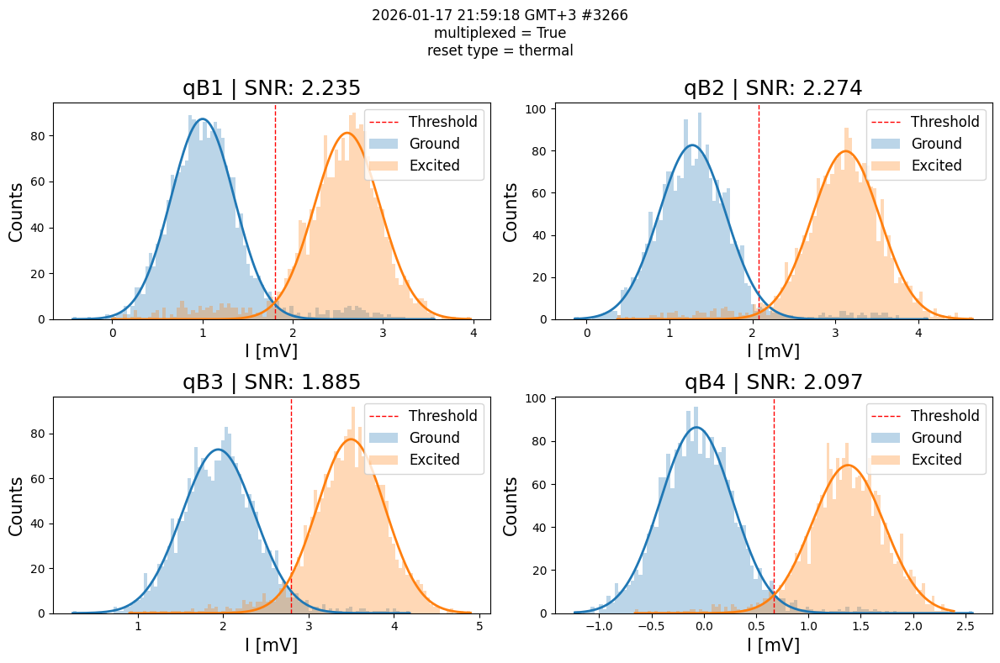

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=900, Aro=0.023, F=93.45%, SNR=2.23 F_est=95.19%
qB2: Ps=-113.45 dBm, Tro=800, Aro=0.03, F=95.58%, SNR=2.27 F_est=96.49%
qB3: Ps=-109.01 dBm, Tro=800, Aro=0.05, F=94.85%, SNR=1.88 F_est=92.70%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.05%, SNR=2.10 F_est=95.23%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "thermal"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 20:59:45,818 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 20:59:50,909 - qm - INFO     - Opening QM
2026-01-17 20:59:50,911 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[20:59:53] QUA program submitted to arbel (id = 0f8ce1bb-e6a0-4e0c-a3b9-d54c1d795b78)              ]8;id=708456;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=766204;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[20:59:56] Execution started                                                                       ]8;id=236761;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=17578;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[20:59:58] Execution finished                                                    

2026-01-17 20:59:58,926 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 20:59:58,927 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 20:59:59,077 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 0.1 deg | ge_threshold: 1.8 mV | rus_threshold: 1.0 mV | readout fidelity: 93.9 % 
 
2026-01-17 20:59:59,079 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 357.3 deg | ge_threshold: 2.2 mV | rus_threshold: 1.1 mV | readout fidelity: 96.0 % 
 
2026-01-17 20:59:59,083 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 0.3 deg | ge_threshold: 3.2 mV | rus_threshold: 2.3 mV | readout fidelity: 95.7 % 
 
2026-01-17 20:59:59,084 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 360.0 deg | ge_threshold: 0.7 mV | rus_threshold: 0.0 mV | readout fidelity: 95.5 % 
 


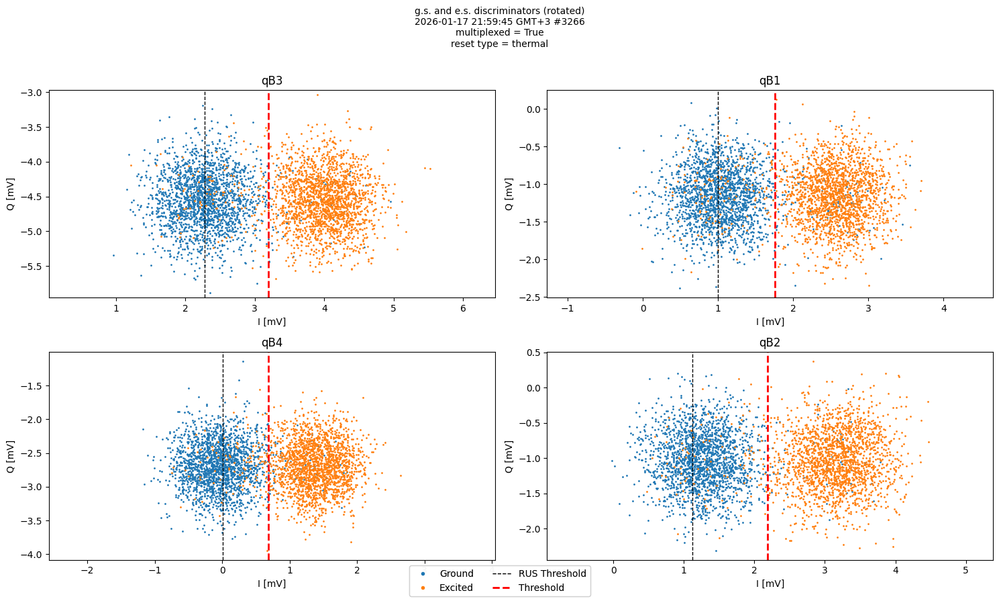

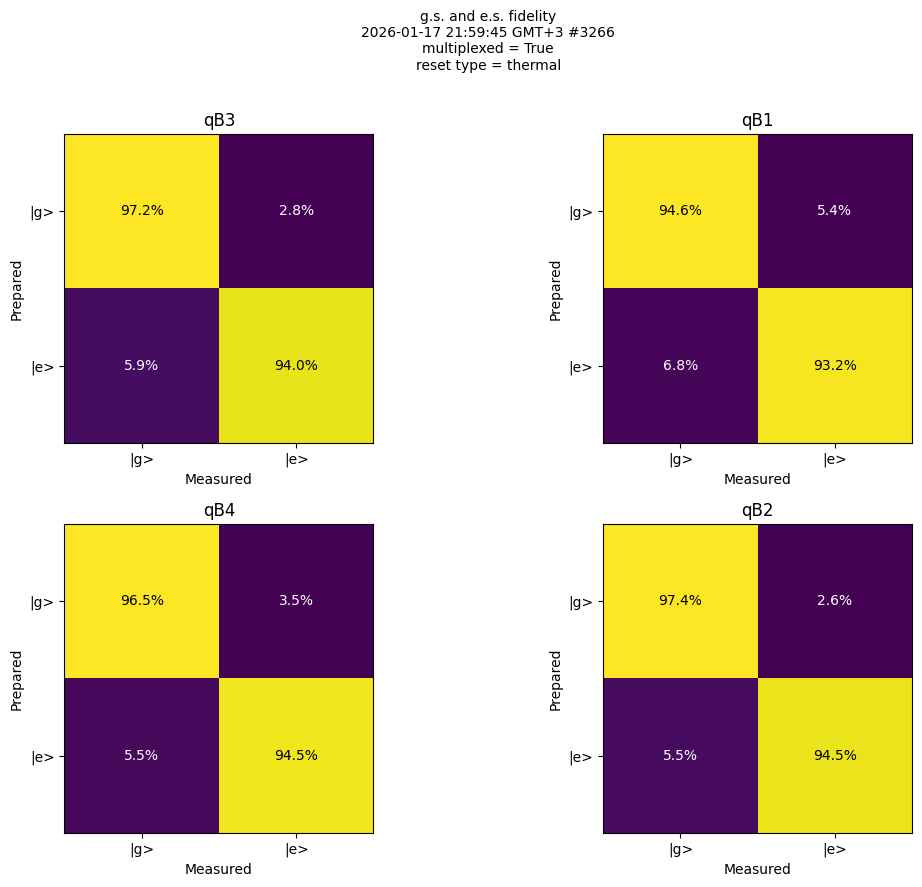

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


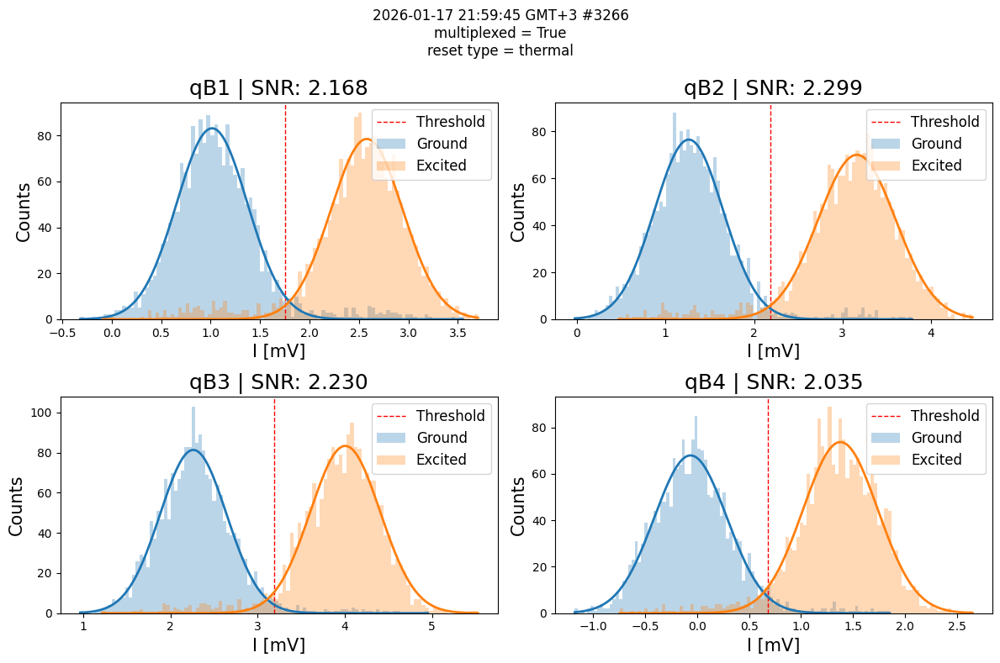

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=900, Aro=0.023, F=93.92%, SNR=2.17 F_est=94.72%
qB2: Ps=-113.45 dBm, Tro=800, Aro=0.03, F=95.97%, SNR=2.30 F_est=96.64%
qB3: Ps=-109.01 dBm, Tro=900, Aro=0.05, F=95.65%, SNR=2.23 F_est=95.85%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=95.55%, SNR=2.04 F_est=94.65%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 21:00:10,609 - INFO - Saving node with snapshot index 3266
2026-01-17 21:00:10,618 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 21:00:10,991 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 21:00:11,040 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3266_07_iq_blobs_210010\quam_state
2026-01-17 21:00:11,092 - INFO - Node saved locally
2026-01-17 21:00:11,093 - INFO - Found quantum computer backend: arbel
2026-01-17 21:00:19,552 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "active"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 21:00:20,852 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 21:00:23,963 - qm - INFO     - Opening QM
2026-01-17 21:00:23,965 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[21:00:27] QUA program submitted to arbel (id = 1d0563da-26dc-413a-8ddc-33b60c393c13)              ]8;id=101889;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=756055;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
           Execution started                                                                       ]8;id=293392;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=980093;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[21:00:35] Execution finished                                                   

2026-01-17 21:00:35,870 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 21:00:35,872 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 21:00:36,030 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 1.2 deg | ge_threshold: 1.8 mV | rus_threshold: 0.9 mV | readout fidelity: 93.6 % 
 
2026-01-17 21:00:36,031 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 0.5 deg | ge_threshold: 2.0 mV | rus_threshold: 1.4 mV | readout fidelity: 96.1 % 
 
2026-01-17 21:00:36,032 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 0.2 deg | ge_threshold: 3.1 mV | rus_threshold: 2.3 mV | readout fidelity: 97.1 % 
 
2026-01-17 21:00:36,033 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 359.5 deg | ge_threshold: 0.6 mV | rus_threshold: -0.0 mV | readout fidelity: 96.8 % 
 


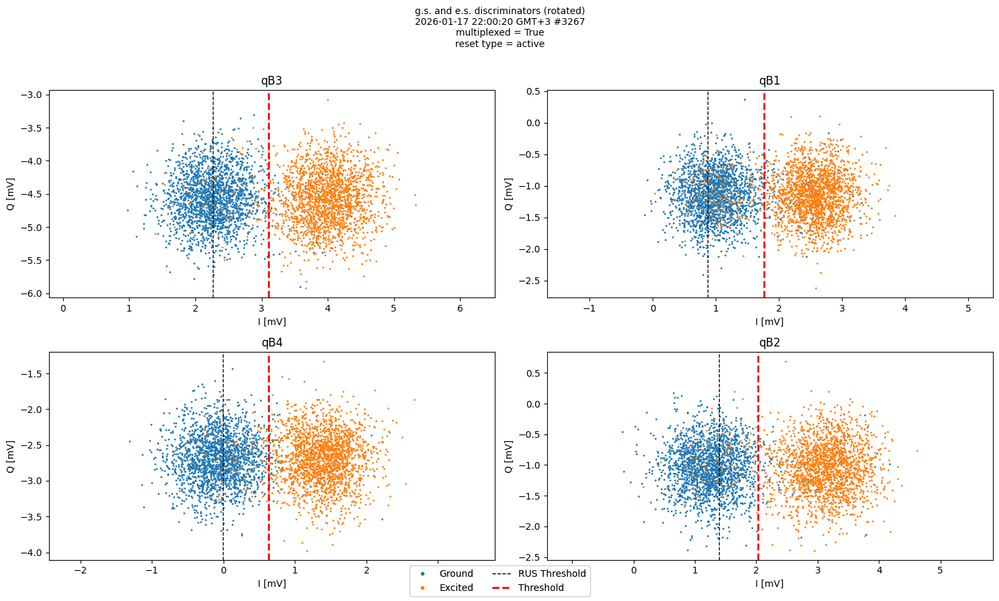

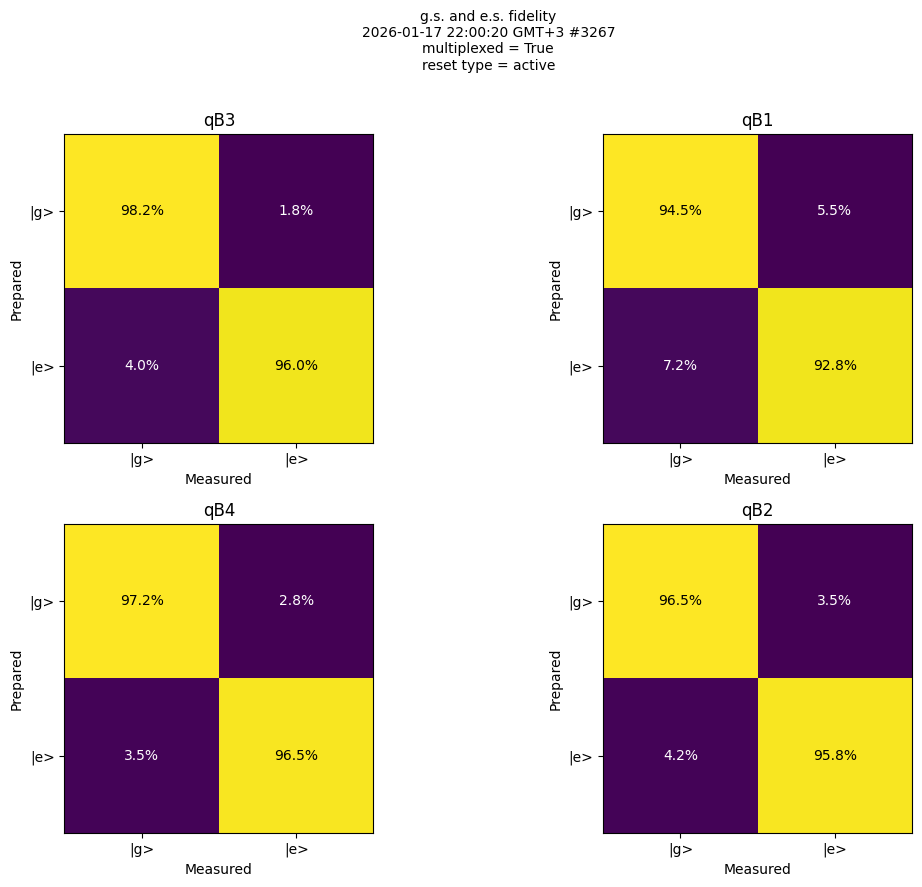

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


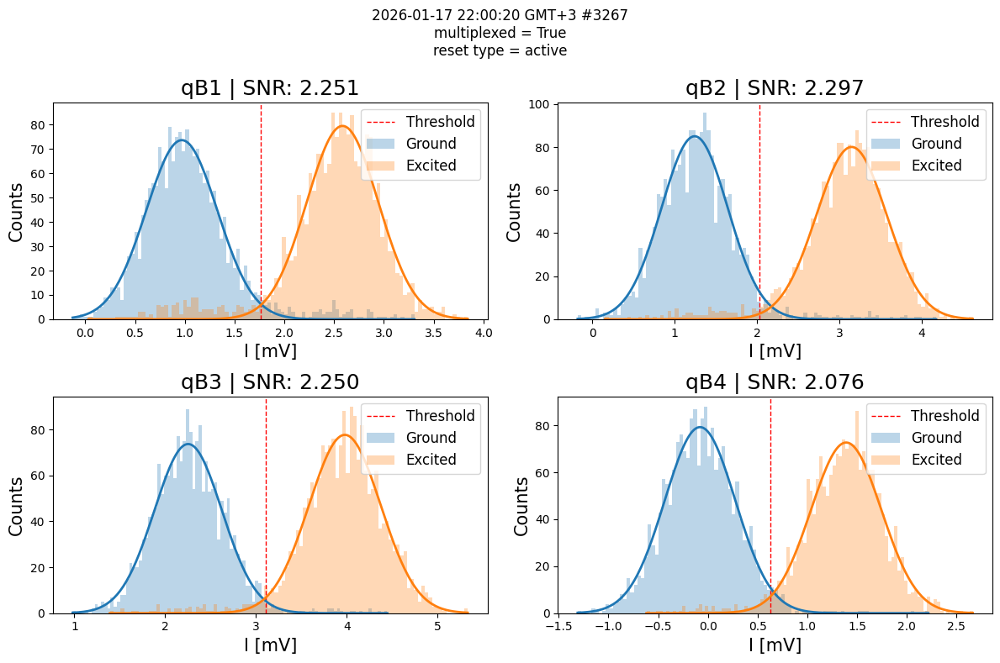

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=900, Aro=0.023, F=93.62%, SNR=2.25 F_est=95.29%
qB2: Ps=-113.45 dBm, Tro=800, Aro=0.03, F=96.12%, SNR=2.30 F_est=96.62%
qB3: Ps=-109.01 dBm, Tro=900, Aro=0.05, F=97.12%, SNR=2.25 F_est=95.98%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=96.83%, SNR=2.08 F_est=95.04%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 21:00:43,063 - INFO - Saving node with snapshot index 3267
2026-01-17 21:00:43,070 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 21:00:43,433 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 21:00:43,485 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3267_07_iq_blobs_210043\quam_state
2026-01-17 21:00:43,538 - INFO - Node saved locally
2026-01-17 21:00:43,541 - INFO - Found quantum computer backend: arbel
2026-01-17 21:00:52,386 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "active"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 21:01:39,339 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 21:01:42,430 - qm - INFO     - Opening QM
2026-01-17 21:01:42,431 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[21:01:45] QUA program submitted to arbel (id = ba4ef8e6-5311-43f4-b375-36027eb90ae6)              ]8;id=652316;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=393469;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[21:01:46] Execution started                                                                       ]8;id=842998;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=292836;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[21:01:54] Execution finished                                                   

2026-01-17 21:01:54,525 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 21:01:54,526 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 21:01:54,647 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 0.0 deg | ge_threshold: 2.3 mV | rus_threshold: 1.4 mV | readout fidelity: 92.0 % 
 
2026-01-17 21:01:54,649 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 360.0 deg | ge_threshold: 4.3 mV | rus_threshold: 2.5 mV | readout fidelity: 94.9 % 
 
2026-01-17 21:01:54,650 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 0.3 deg | ge_threshold: 8.7 mV | rus_threshold: 7.2 mV | readout fidelity: 94.9 % 
 
2026-01-17 21:01:54,651 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 0.4 deg | ge_threshold: 2.0 mV | rus_threshold: 0.8 mV | readout fidelity: 97.5 % 
 


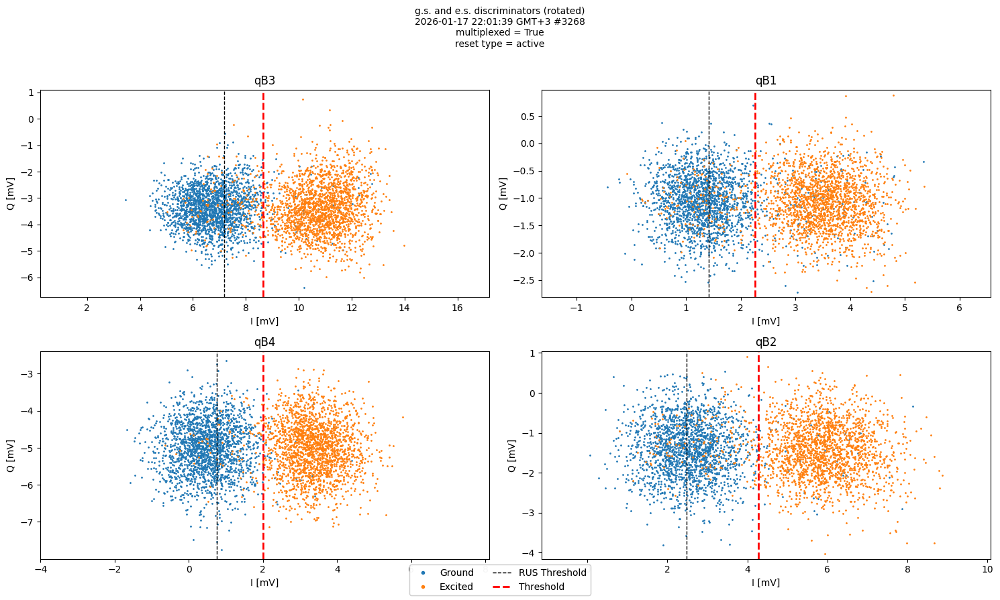

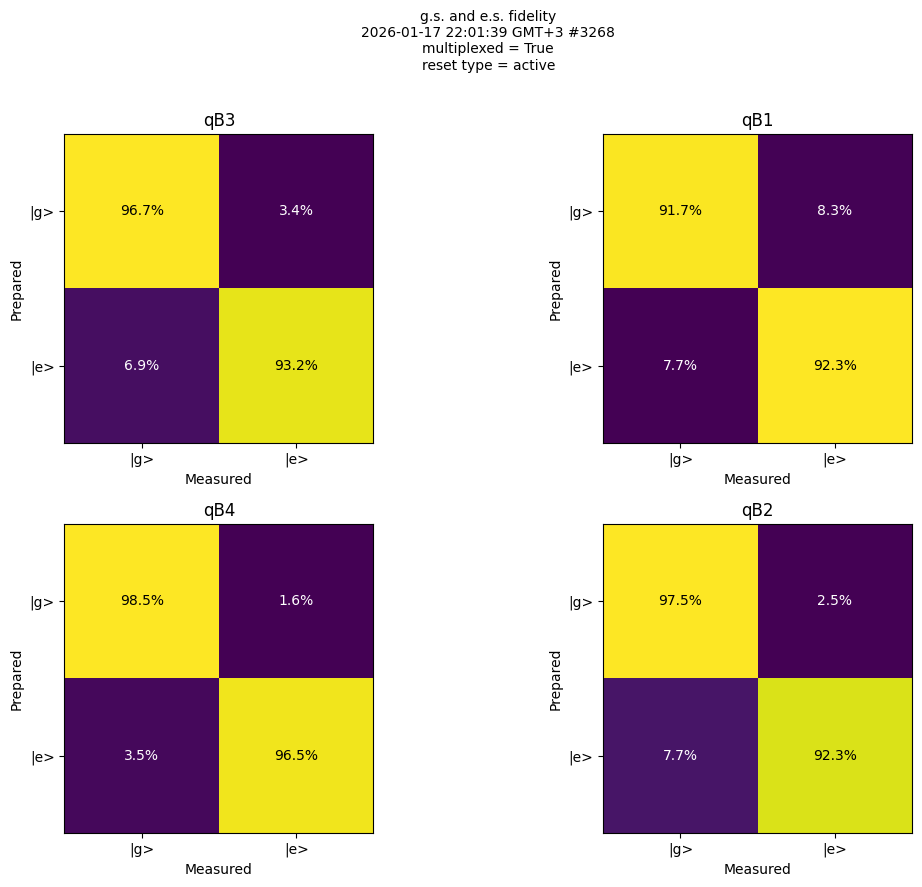

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


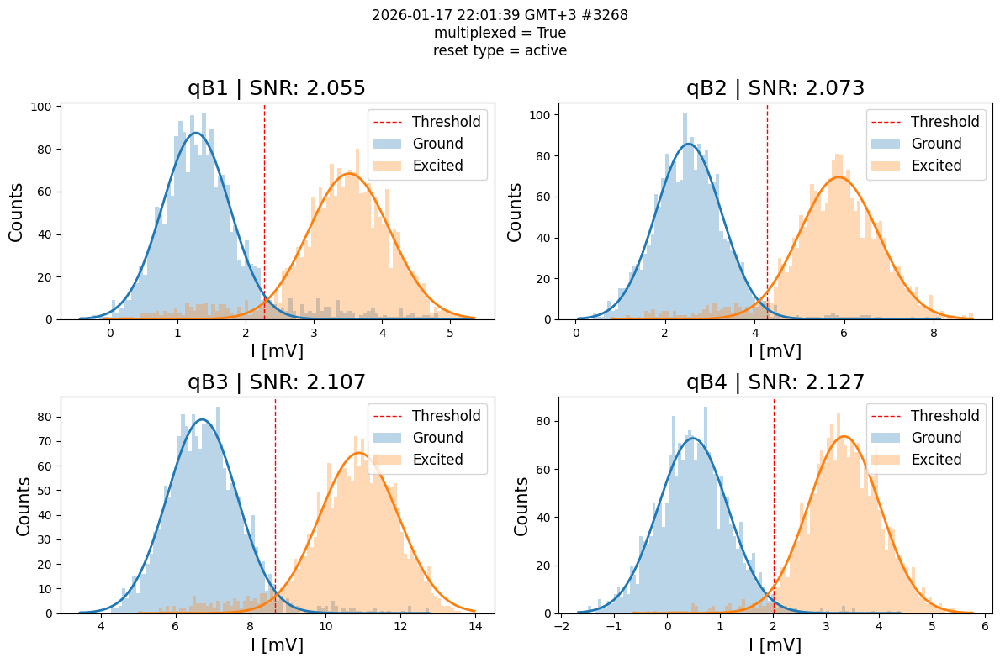

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1100, Aro=0.023, F=92.00%, SNR=2.05 F_est=93.29%
qB2: Ps=-113.45 dBm, Tro=900, Aro=0.03, F=94.92%, SNR=2.07 F_est=94.84%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=94.90%, SNR=2.11 F_est=93.91%
qB4: Ps=-105.49 dBm, Tro=780, Aro=0.075, F=97.50%, SNR=2.13 F_est=95.47%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 21:02:18,995 - INFO - Saving node with snapshot index 3268
2026-01-17 21:02:19,003 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 21:02:19,352 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 21:02:19,401 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3268_07_iq_blobs_210219\quam_state
2026-01-17 21:02:19,455 - INFO - Node saved locally
2026-01-17 21:02:19,457 - INFO - Found quantum computer backend: arbel
2026-01-17 21:02:26,976 - INFO - Node successfully uploaded to cloud


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from calibration_utils.iq_blobs.plotting import plot_historams
import xarray as xr
from dataclasses import asdict

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualang_tools.units import unit

from iqcc_calibration_tools.qualibrate_config.qualibrate.node import QualibrationNode
from iqcc_calibration_tools.quam_config.components.quam_root import Quam
from calibration_utils.iq_blobs import (
    Parameters,
    process_raw_dataset,
    fit_raw_data,
    log_fitted_results,
    plot_iq_blobs,
    plot_confusion_matrices,
)
from qualibration_libs.parameters import get_qubits
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

In [ ]:
description = """
        IQ BLOBS
This sequence involves measuring the state of the resonator 'N' times, first after thermalization (with the qubit in
the |g> state) and then after applying a x180 (pi) pulse to the qubit (bringing the qubit to the |e> state).
The resulting IQ blobs are displayed, and the data is processed to determine:
    - The rotation angle required for the integration weights, ensuring that the
      separation between |g> and |e> states aligns with the 'I' quadrature.
    - The threshold along the 'I' quadrature for effective qubit state discrimination (at the center between the two blobs).
    - The repeat-until-success threshold along the 'I' quadrature for effective active reset (at the center of the |g> blob).
    - The readout confusion matrix, which is also influenced by the x180 pulse fidelity.

Prerequisites:
    - Having calibrated the readout parameters (nodes 02a, 02b and/or 02c).
    - Having calibrated the qubit x180 pulse parameters (nodes 03a_qubit_spectroscopy.py and 04b_power_rabi.py).

State update:
    - The integration weight angle: qubit.resonator.operations["readout"].integration_weights_angle
    - the ge discrimination threshold: qubit.resonator.operations["readout"].threshold
    - the Repeat Until Success threshold: qubit.resonator.operations["readout"].rus_exit_threshold
    - The confusion matrix: qubit.resonator.operations["readout"].confusion_matrix
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="07_iq_blobs",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """
    Allow the user to locally set the node parameters for debugging purposes, or
    execution in the Python IDE.
    """
    # You can get type hinting in your IDE by typing node.parameters.
    node.parameters.qubits = ["qB1","qB2","qB3","qB4"]
    node.parameters.multiplexed=True
    node.parameters.reset_type = "active"
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()

2026-01-17 21:04:08,264 - qualibrate - INFO - Creating node 07_iq_blobs


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Create the sweep axes and generate the QUA program from the pulse sequence and the
    node parameters.
    """
    # Class containing tools to help handle units and conversions.
    u = unit(coerce_to_integer=True)
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    n_runs = node.parameters.num_shots  # Number of runs
    operation = node.parameters.operation
    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "n_runs": xr.DataArray(np.linspace(1, n_runs, n_runs), attrs={"long_name": "number of shots"}),
    }

    with program() as node.namespace["qua_program"]:
        I_g, I_g_st, Q_g, Q_g_st, n, n_st = node.machine.declare_qua_variables()
        I_e, I_e_st, Q_e, Q_e_st, _, _ = node.machine.declare_qua_variables()

        for multiplexed_qubits in qubits.batch():
            # Initialize the QPU in terms of flux points (flux tunable transmons and/or tunable couplers)
            for qubit in multiplexed_qubits.values():
                node.machine.initialize_qpu(target=qubit)
            align()

            with for_(n, 0, n < n_runs, n + 1):
                save(n, n_st)

                # Ground state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()
                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.resonator.measure(operation, qua_vars=(I_g[i], Q_g[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_g[i], I_g_st[i])
                    save(Q_g[i], Q_g_st[i])
                align()

                # Excited state iq blobs for all qubits
                # Qubit initialization
                for i, qubit in multiplexed_qubits.items():
                    qubit.reset(node.parameters.reset_type, node.parameters.simulate)
                align()

                # Qubit readout
                for i, qubit in multiplexed_qubits.items():
                    qubit.xy.play("x180")
                    qubit.align()
                    qubit.resonator.measure(operation, qua_vars=(I_e[i], Q_e[i]))
                    qubit.resonator.wait(qubit.resonator.depletion_time * u.ns)
                    # save data
                    save(I_e[i], I_e_st[i])
                    save(Q_e[i], Q_e_st[i])

        with stream_processing():
            n_st.save("n")
            for i in range(num_qubits):
                I_g_st[i].buffer(n_runs).save(f"Ig{i + 1}")
                Q_g_st[i].buffer(n_runs).save(f"Qg{i + 1}")
                I_e_st[i].buffer(n_runs).save(f"Ie{i + 1}")
                Q_e_st[i].buffer(n_runs).save(f"Qe{i + 1}")

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(qmm, config, node.namespace["qua_program"], node.parameters)
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}

In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is not None or node.parameters.simulate)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """
    Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw".
    """
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher["n"],
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset
    node.results["ds_raw"] = process_raw_dataset(node.results["ds_raw"], node)

c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\quam\components\channels.py:636: UserWarning: The 'thread' element argument is deprecated from qm.qua >= 1.2.2. Use 'core' instead.
  warnings.warn(


2026-01-17 21:04:11,257 - qm - INFO     - Opening QM
2026-01-17 21:04:11,258 - qm - WARNING  - Could not generate a loaded config. Maybe there is no `QuantumMachinesManager` instance?
[21:04:14] QUA program submitted to arbel (id = a1e2f079-0e48-47dd-9327-ff24a7518132)              ]8;id=421083;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=969913;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#324\324]8;;\
[21:04:15] Execution started                                                                       ]8;id=949450;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py\computers.py]8;;\:]8;id=337192;file://c:\Users\KimJeongwon\iqcc-calibration-1\.venv\Lib\site-packages\iqcc_cloud_client\computers.py#344\344]8;;\
[21:04:23] Execution finished                                                   

2026-01-17 21:04:23,840 - qualibrate - INFO - Node 07_iq_blobs - None


2026-01-17 21:04:23,841 - qm - INFO     - Closing QM


In [ ]:
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """
    Analyse the raw data and store the fitted data in another xarray dataset "ds_fit"
    and the fitted results in the "fit_results" dictionary.
    """
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }

2026-01-17 21:04:24,009 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB1:  SUCCESS!
IW angle: 7.5 deg | ge_threshold: 2.6 mV | rus_threshold: 1.2 mV | readout fidelity: 92.1 % 
 
2026-01-17 21:04:24,010 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB2:  SUCCESS!
IW angle: 12.0 deg | ge_threshold: 3.7 mV | rus_threshold: 2.1 mV | readout fidelity: 95.0 % 
 
2026-01-17 21:04:24,011 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB3:  SUCCESS!
IW angle: 359.8 deg | ge_threshold: 8.5 mV | rus_threshold: 6.7 mV | readout fidelity: 95.1 % 
 
2026-01-17 21:04:24,012 - qualibrate - INFO - Node 07_iq_blobs - Results for qubit qB4:  SUCCESS!
IW angle: 13.6 deg | ge_threshold: 2.5 mV | rus_threshold: 0.9 mV | readout fidelity: 98.8 % 
 


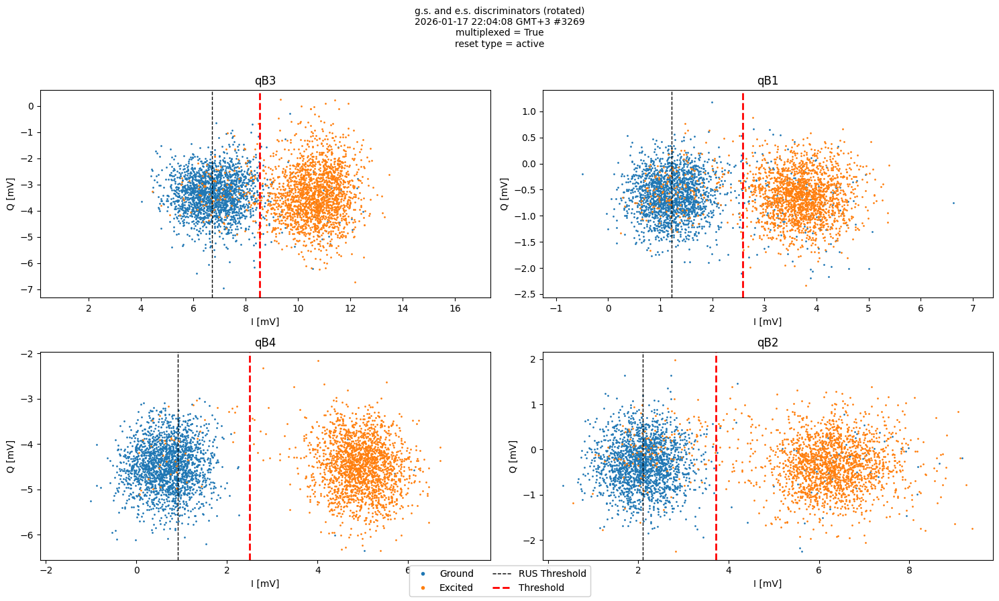

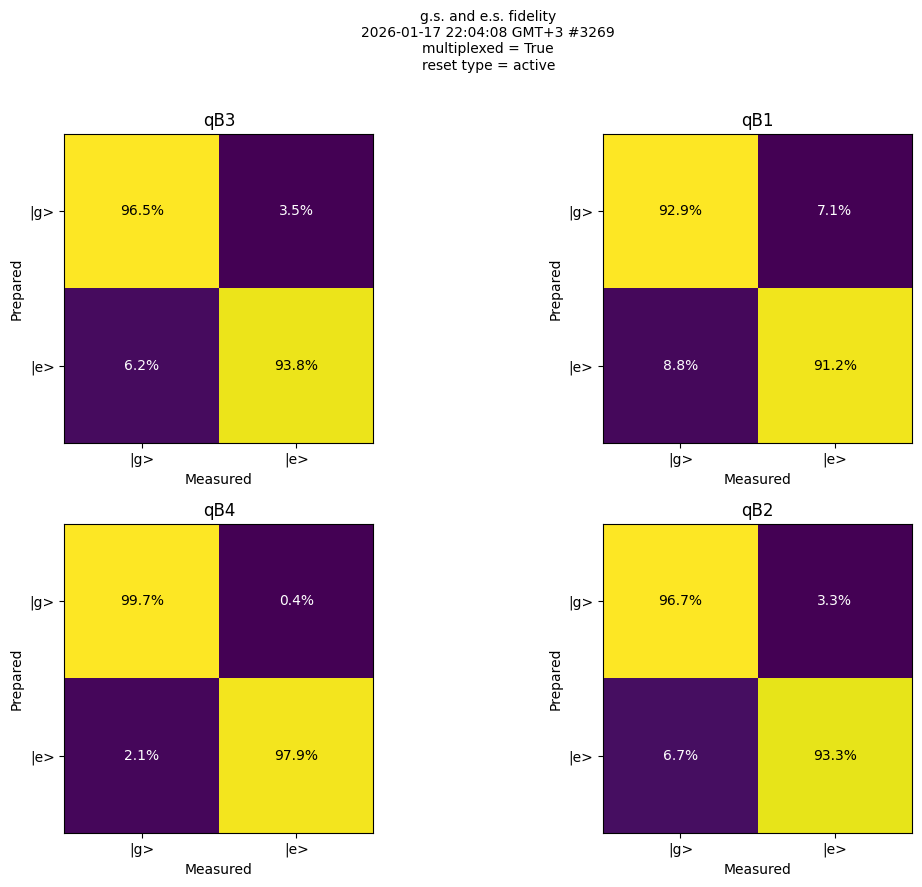

In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """
    Plot the raw and fitted data in specific figures whose shape is given by
    qubit.grid_location.
    """
    fig_iq = plot_iq_blobs(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    fig_confusion = plot_confusion_matrices(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    # fig_histogram = plot_historams(node.results["ds_raw"], node.namespace["qubits"], node.results["ds_fit"])
    node.add_node_info_subtitle(fig_iq)
    node.add_node_info_subtitle(fig_confusion)
    # node.add_node_info_subtitle(fig_histogram)
    plt.show()
    # Store the generated figures
    node.results["figures"] = {
        "iq_blobs": fig_iq,
        "confusion_matrix": fig_confusion,
        # "histograms": fig_histogram,
    }

C:\Users\KimJeongwon\iqcc-calibration-1\iqcc_calibration_tools\qualibrate_config\qualibrate\node.py:303: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to prevent overlap with less spacing


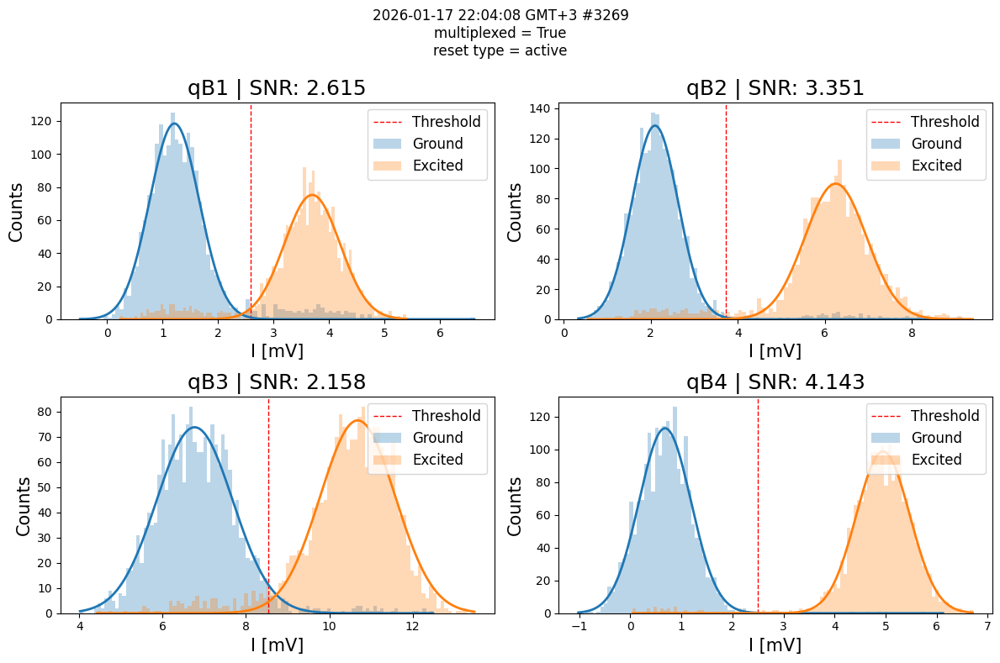

In [ ]:
from scipy.optimize import curve_fit
from iqcc_calibration_tools.quam_config.lib.qua_datasets import opxoutput
from scipy.special import erf
from datetime import datetime
qubits=node.namespace["qubits"]
fits=node.results["ds_fit"] 
ds= node.results["ds_raw"]

def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Define the grid layout (e.g., 2 columns, rows calculated based on qubit count)
num_qubits = len(qubits)
cols = 2
rows = (num_qubits + 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten() # Flatten in case of a 2D grid for easy indexing
snr=[]
for i in range(num_qubits):
    ax = axes[i]
    qubit_id = qubits[i].id
    
    # Extract and flatten data
    Ig_mv = (fits.Ig_rot.values[i] * 1e3).flatten()
    Ie_mv = (fits.Ie_rot.values[i] * 1e3).flatten()

    fit_params = {}
    ax.axvline(1e3 * fits.ge_threshold.values[i], color="r", linestyle="--", lw=1, label="Threshold")

    # Process both states
    for data, label, color in [(Ig_mv, "Ground", "tab:blue"), (Ie_mv, "Excited", "tab:orange")]:
        counts, bins = np.histogram(data, bins=100)
        centers = (bins[:-1] + bins[1:]) / 2
        p0 = [np.mean(data), np.std(data), np.max(counts)]
        
        try:
            param, _ = curve_fit(gaussian, centers, counts, p0=p0)
            mu, sigma, A = param
            fit_params[label] = (mu, sigma)
            
            # Plotting
            x_range = np.linspace(min(data), max(data), 200)
            ax.plot(x_range, gaussian(x_range, *param), color=color, lw=2)
            ax.hist(data, bins=100, alpha=0.3, color=color, label=label)

        except RuntimeError:
            fit_params[label] = (np.nan, np.nan)

    # SNR Calculation
    mu_g, sig_g = fit_params.get("Ground", (np.nan, np.nan))
    mu_e, sig_e = fit_params.get("Excited", (np.nan, np.nan))
    
    if not np.isnan(mu_g) and not np.isnan(mu_e):
        snr_val = abs(mu_e - mu_g) / (abs(sig_g) + abs(sig_e))
        snr.append(snr_val)
        ax.set_title(f"{qubit_id} | SNR: {snr_val:.3f}", fontsize=18)
    else:
        ax.set_title(f"{qubit_id} | Fit Failed")

    ax.set_xlabel("I [mV]", fontsize=15)
    ax.set_ylabel("Counts", fontsize=15)
    ax.legend(fontsize=12, loc="upper right")

# Hide unused subplots if num_qubits is odd
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"{node.add_node_info_subtitle()}")
plt.show()

In [ ]:
def fidelity(ro,t1,snr):
        return   np.exp(-ro/(2*t1))*erf(snr/(np.sqrt(2)))
readout_power=[np.round(opxoutput(node.namespace["qubits"][i].resonator.opx_output.full_scale_power_dbm,node.namespace["qubits"][i].resonator.operations["readout"].amplitude)-76,2) for i in range(len(node.namespace["qubits"]))]
readout_length=[node.namespace["qubits"][i].resonator.operations["readout"].length for i in range(len(node.namespace["qubits"]))]
node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
for i in range(len(readout_power)):
    print(
        f"{node.namespace['qubits'][i].name}: "
        f"Ps={readout_power[i]} dBm, "
        f"Tro={readout_length[i]}, "
        f"Aro={node.namespace['qubits'][i].resonator.operations['readout'].amplitude},",
        f"F={fit_results[node.namespace['qubits'][i].name].readout_fidelity:.2f}%,",
        f"SNR={snr[i]:.2f}",
        f"F_est={100*fidelity(readout_length[i]*1e-9,node.namespace['qubits'][i].T1,snr[i]):.2f}%",)

qB1: Ps=-115.76 dBm, Tro=1500, Aro=0.023, F=92.05%, SNR=2.61 F_est=95.29%
qB2: Ps=-113.45 dBm, Tro=1500, Aro=0.03, F=95.03%, SNR=3.35 F_est=97.61%
qB3: Ps=-109.01 dBm, Tro=1500, Aro=0.05, F=95.12%, SNR=2.16 F_est=94.31%
qB4: Ps=-105.49 dBm, Tro=1500, Aro=0.075, F=98.75%, SNR=4.14 F_est=97.66%


In [ ]:
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit data analysis was successful."""
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue

            fit_result = node.results["fit_results"][q.name]
            operation = q.resonator.operations[node.parameters.operation]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])
            # Convert the thresholds back to demod units
            operation.threshold = float(fit_result["ge_threshold"]) * operation.length / 2**12
            operation.rus_exit_threshold = float(fit_result["rus_threshold"]) * operation.length / 2**12
            if node.parameters.operation == "readout":
                q.resonator.confusion_matrix = fit_result["confusion_matrix"]

In [ ]:
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()

2026-01-17 21:05:04,313 - INFO - Saving node with snapshot index 3269
2026-01-17 21:05:04,319 - qualibrate - INFO - Saving node 07_iq_blobs to local storage
2026-01-17 21:05:04,670 - qualibrate - INFO - Saving machine to active path C:\Users\KimJeongwon\qw_statestore_QCC\quam_state
2026-01-17 21:05:04,723 - qualibrate - INFO - Saving machine to data folder C:\Users\KimJeongwon\.qualibrate\user_storage\JWKim\2026-01-17\#3269_07_iq_blobs_210504\quam_state
2026-01-17 21:05:04,770 - INFO - Node saved locally
2026-01-17 21:05:04,772 - INFO - Found quantum computer backend: arbel
2026-01-17 21:05:12,416 - INFO - Node successfully uploaded to cloud


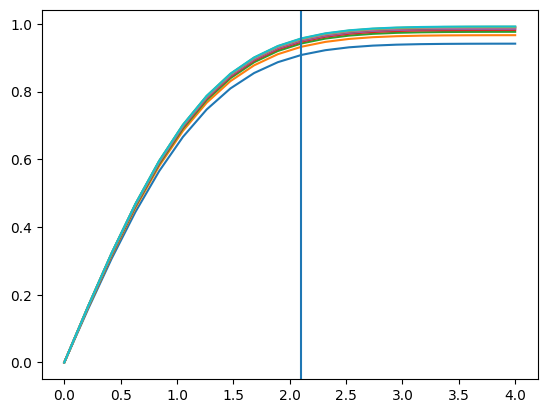

In [ ]:
snr=np.linspace(0,4,20)
t1=np.linspace(5,40,10)
# for i in range(len(t1)):
#     plt.plot(snr,np.exp(-1.5/(2*t1[i]))*erf(snr/(np.sqrt(2))))
for i in range(len(t1)):
    plt.plot(snr,np.exp(-0.6/(2*t1[i]))*erf(snr/(np.sqrt(2))))


plt.axvline(2.1)